# RODS INSPECTION - Matteo Ambrosini, Tommaso Zaccherini.


In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd
from numpy.core.numeric import NaN

# LOAD AND DISPLAY IMAGES

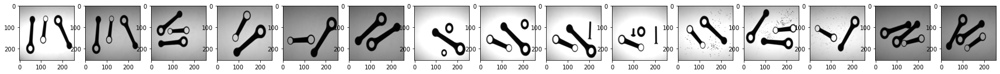

In [2]:
dirname = "images/"
entries = [dirname + str(k) + ".BMP" for k in range(1,16)]
fig = plt.figure(figsize=(30, 30))
columns = len(entries)
rows = 2
i = 1
img_list = []
for fn in entries:
    img = cv2.imread(fn, cv2.IMREAD_GRAYSCALE)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img.astype('uint8'), cmap='gray', vmin=0, vmax=255)
    img_list.append(img)
    i = i +1
plt.show()

# HISTOGRAMS

We computed the histograms and checked that they are bimodal, so we can apply a global threshold. We adopt the **Automatic Treshold** method implemented by Otsu's algorithm in order to make the binarization process robust to changing lighting condition.

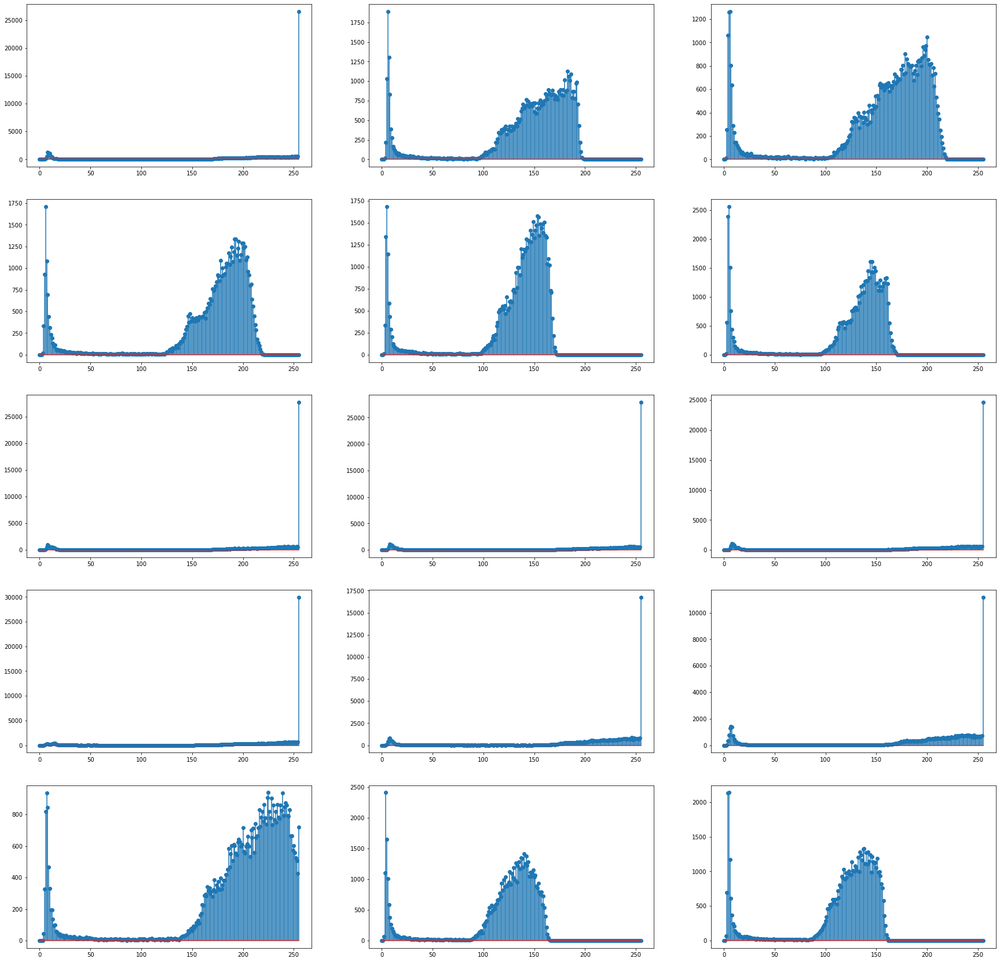

In [3]:
fig = plt.figure(figsize=(30, 30))
i = 1
for el in img_list:
    hist_original, bins_original = np.histogram(el.astype(np.uint8).flatten(),256,[0,256])
    fig.add_subplot(5, 3, i)
    plt.stem(hist_original,use_line_collection=True)
    i = i +1

plt.show()

# OTSU'S ALGORITHM
The application of Otsu allows to segment the image and to distinguish background from foreground pixels. Though it does not allow to cancel out salt and pepper noise which can be present in some cases. A median filter is therefore needed at this purpose.

Since the median filter can be applied both to gray scale and binary images (due to the fact that it doesn't compromise binarization) we tried to filter before and after binarization in order to see if one is better than the other.

By looking at the results below we found out that by filtering before Otsu the filtering action reduces the "salt and pepper" noise enough to be considered as background by the segmentation algorithm. However, it may be less robust than the other solution because the noise is just smoothed and not completely cancelled. In fact the median would be found between the whole grayscale, while by applying the median filter to an already binarized image it returns just a black or white pixel.
The results can be seen in the central images of the next plot section.

Taking into account of the previous consideration and the fact that in both cases it is required to filter the images four times in order to cancel out the noise completely, we used the binary images obtained as a result of the  **median filtering after Otsu**.



# Median filter before Otsu

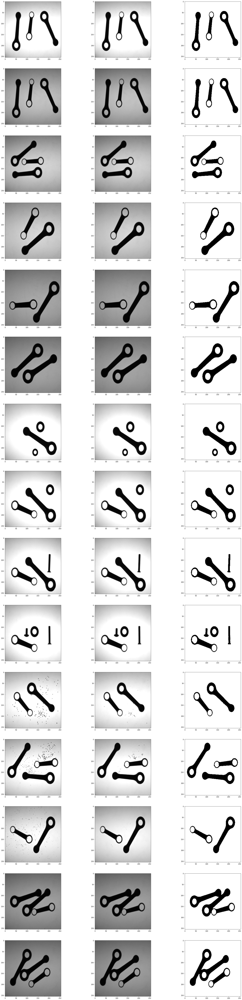

In [4]:
fig = plt.figure(figsize=(30,120))

img_list_to_filter = img_list.copy()
i = 1                                # index for image plotting  
N = len(img_list_to_filter)  

for img in img_list_to_filter:

    median1 = cv2.medianBlur(img,3)
    median2 = cv2.medianBlur(median1,3)
    median3 = cv2.medianBlur(median2,3)
    median4 = cv2.medianBlur(median3,3)
    ret_filt,thresh_filt = cv2.threshold(median4,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    # display input image
    fig.add_subplot(N, 3, i) # rows , columns, idx
    plt.imshow(img, cmap='gray', vmin=0, vmax=255)
    i = i+1

    # display filtered image
    fig.add_subplot(N, 3, i) # rows , columns, idx
    plt.imshow(median4, cmap='gray', vmin=0, vmax=255)
    i = i+1

    # display binarized image
    fig.add_subplot(N, 3, i) # rows , columns, idx
    plt.imshow(thresh_filt, cmap='gray', vmin=0, vmax=255)
    i = i+1

plt.show()


# Median filter after Otsu


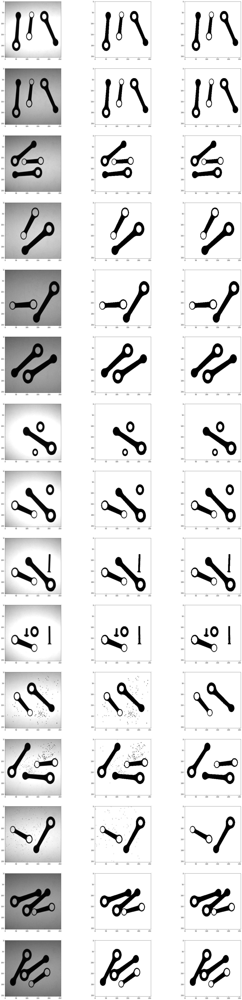

In [5]:
thresh_list = []  # list of filtered and binarized images

fig = plt.figure(figsize=(30,120))
img_list_to_filter = img_list.copy()

i = 1 # index for plotting images
N = len(img_list_to_filter)  

for img in img_list_to_filter:
    
    # binarization
    ret,thresh = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    # filtering
    median1 = cv2.medianBlur(thresh,3)
    median2 = cv2.medianBlur(median1,3)
    median3 = cv2.medianBlur(median2,3)
    median4 = cv2.medianBlur(median3,3)
    thresh_list.append(median4)  # append the filtered image

    # display input image
    fig.add_subplot(N, 3, i) # rows , columns, idx
    plt.imshow(img, cmap='gray', vmin=0, vmax=255)
    i = i+1

    # display binarized image
    fig.add_subplot(N, 3, i) # rows , columns, idx
    plt.imshow(thresh, cmap='gray', vmin=0, vmax=255)
    i = i+1

    # display filtered image
    fig.add_subplot(N, 3, i) # rows , columns, idx
    plt.imshow(median4, cmap='gray', vmin=0, vmax=255)
    i = i+1

plt.show()

# LABELLING
Once obtained the binarized images it is required to distinguish the components in foreground, so we adopted an already built in labelling function in openCV:

    num_labels, labels_im = cv2.connectedComponentsWithAlgorithm()

It returns the number of labels and the labelled image.

The background is given the label '0' so we will exclude it in the following analisys.

We found several types of labelling functions that return also the area, barycenter and the Image oriented bounding box of each component but we preferred to compute all by our own. Since we are interested in the Object oriented bounding box it would have been computationally inefficient to compute these quantities with the use of the function.



**Foreground labeling example:**

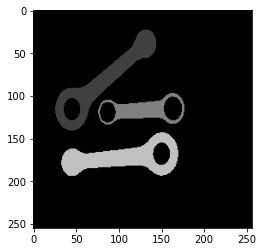

In [6]:
connectivity = 4  
num_labels, labels_im = cv2.connectedComponentsWithAlgorithm(255-thresh_list[2], connectivity, cv2.CV_32S,0)
labels_im = labels_im*(255/num_labels)  # relable for displaying
plt.imshow(labels_im, cmap='gray', vmin=0, vmax=255)
plt.show()

Similarly the hole detection will be done by labelling the backround pixels of each extracted components.

**Background labeling example:**

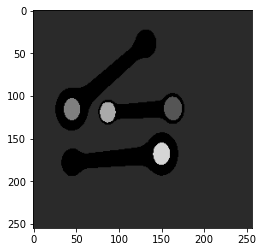

In [7]:
num_holes, labeled_hole=cv2.cv2.connectedComponentsWithAlgorithm(thresh_list[2], connectivity, cv2.CV_32S,0)
labels_h= labeled_hole*(255/num_holes)
plt.imshow(labels_h, cmap='gray', vmin=0, vmax=255)
plt.show()

# OBJECT ORIENTED BOUNDING BOX
We organize the labelling and the further analisys in three functions:

 - **1.** (L, W, dist_barycenter) = Object_Oriented_BB(eigvec_major, eigvec_minor, barycenter, x, y,connected=False)

 - **2.** (barycenter,theta,eigvec_major,eigvec_minor,eigval_ratio)= find_pos(x,y)
    
 - **3.** Components_stats(bin_img, img_in_list)

**1.** The first function is called by the third one for each component of the image in order to extract its length, width and width at the barycenter.
It takes as input the major and minor axes directions, the barycenter coordinates, two vectors 'x' and 'y' and the flag connected.
'x' and 'y' are the vectors containing respectively the 'j' and 'i' coordinates just of the non zero pixels of the component contour. This is done to reduce the computational burden of the function.
The last parameter is a flag which can be used in order to modify the behavior of the function in case of possible touching components.
In order to compute the **dimensions** of the object we relied on the points at maximum and minimum **signed distance** from the major and minor axes. Then we obtained the Object oriented bounding box whose dimensions correspond to those of the object.
For what concerns the **width at the barycenter** we found the two points belonging to the countour at the minimum distance from the minor axis and at opposite sides with respect to the major axis. Therefore we applied a mask to distinguish between points with positive and negative distance with respect to the major axis and found the ones at minimum absolute distance from the minor axis. Finally we computed the Euclidean distance between those.
In case of connected components lenght and width are returned as NaN because the function, in this case, works on shrinked version of components.  

**2.** The second one takes as input two vector 'x' and 'y' and returns the informations about baricenter, orientation and main axes of the component.
In this case the two inputs contain all the non zero pixels of the component.

**3.** The third function is the main one which call all the others. It extracts each component by labelling the binary image received as input and places them separately inside a list called 'components'. For each of them it computes:

    - x,y
    - number of holes and labels them
    - the type of the component based on the number of holes and the eigenvalues ratio. 
    
The distractos are detected by looking at the number of holes (which is zero in case of screws) and at the eigenvalues ratio (which is close to one in case of washers). 

If the component is of type 'A' or 'B' the function extracts the holes of the component and for each one it computes:

    - hole center
    - hole diameter
    
The diameter is computed as the mean of the mean distance of the inner and outer contour points from the hole's center. This results more precise than other methods that we tried based on computing the perimeter of the hole and diving by pi.

<img src="STD_SC.png" width=700>

**Comments:** 
- We chose 4-connectivity for the component extraction because we don't want to consider as one component blobs which are connected just by one diagonal pixel.

- We chose 8-connectivity for hole extraction in order to be more conservative in their detection, we have indeed found out that with the 4-connectivity the algorithm would detect holes even in the middle of contact regions.

- We will adopt a notation the closest as possible to the one on slides. The only difference regards the fact that we put the coordinates in the order j, i which correspond to the x, y axes of pyplot.

In [8]:
def Object_Oriented_BB(eigvec_major,eigvec_minor,barycenter,x,y,connected=False):
    scale = 100
    j_b, i_b = barycenter

    # Major axis
    a_maj = eigvec_major[1]
    b_maj = -eigvec_major[0]
    c_maj = -(a_maj*j_b + b_maj*i_b)

    # Signed distance from major axis and points at maximum and minimum distance
    dist_maj = (a_maj*x+b_maj*y+c_maj)/(a_maj**2+b_maj**2)
    index_C1 = np.argmax(dist_maj)
    i_C1 = y[index_C1]
    j_C1 = x[index_C1]
    c_C1 = -(a_maj*j_C1 + b_maj*i_C1)

    index_C2 = np.argmin(dist_maj)
    i_C2 = y[index_C2]
    j_C2 = x[index_C2]
    c_C2 = -(a_maj*j_C2 + b_maj*i_C2)

    # Minor axis
    a_min = eigvec_minor[1]
    b_min = -eigvec_minor[0]
    c_min = -(a_min*j_b + b_min*i_b)

    # Signed distance from minor axis and points at maximum and minimum distance
    dist_min = (a_min*x+b_min*y+c_min)/(a_min**2+b_min**2)
    index_C3 = np.argmax(dist_min)
    i_C3 = y[index_C3]
    j_C3 = x[index_C3]
    c_C3 = -(a_min*j_C3 + b_min*i_C3)

    index_C4 = np.argmin(dist_min)
    i_C4 = y[index_C4]
    j_C4 = x[index_C4]
    c_C4 = -(a_min*j_C4 + b_min*i_C4)

    # Find the corners of the bounding box
    j_V1 = (b_maj*c_C3 - b_min*c_C1)/(a_maj*b_min - b_maj*a_min)
    j_V2 = (b_maj*c_C4 - b_min*c_C1)/(a_maj*b_min - b_maj*a_min)
    j_V3 = (b_maj*c_C3 - b_min*c_C2)/(a_maj*b_min - b_maj*a_min)
    j_V4 = (b_maj*c_C4 - b_min*c_C2)/(a_maj*b_min - b_maj*a_min)

    i_V1 = (a_min*c_C1 - a_maj*c_C3)/(a_maj*b_min - b_maj*a_min)
    i_V2 = (a_min*c_C1 - a_maj*c_C4)/(a_maj*b_min - b_maj*a_min)
    i_V3 = (a_min*c_C2 - a_maj*c_C3)/(a_maj*b_min - b_maj*a_min)
    i_V4 = (a_min*c_C2 - a_maj*c_C4)/(a_maj*b_min - b_maj*a_min)

    if (not connected):          # Case in which no contacts are expected
    # Draw Object oriented bounding Box
        plt.plot([j_V1, j_V3],
                  [i_V1, i_V3], color='purple')
        plt.plot([j_V1, j_V2],
                  [i_V1, i_V2], color='purple')
        plt.plot([j_V3, j_V4],
                  [i_V3, i_V4], color='purple')
        plt.plot([j_V4, j_V2],
                  [i_V4, i_V2], color='purple')

    # Lenght and width of the component
        L = np.sqrt((i_V1-i_V2)**2+(j_V1-j_V2)**2)
        W = np.sqrt((i_V1-i_V3)**2+(j_V1-j_V3)**2)
    
    else:                       # Case in which contacts are expected
    # Draw Object oriented bounding Box of the shrinked components
        plt.plot([j_V1, j_V3],
                  [i_V1, i_V3],color='purple',linestyle='dashed')
        plt.plot([j_V1, j_V2],
                  [i_V1, i_V2],color='purple',linestyle='dashed')
        plt.plot([j_V3, j_V4],
                  [i_V3, i_V4],color='purple',linestyle='dashed')
        plt.plot([j_V4, j_V2],
                  [i_V4, i_V2],color='purple',linestyle='dashed')
        L = NaN
        W = NaN


# Width at the barycenter: we exploit the distance already computed, this time minimized to obtain the intersection point between borders and minor axis

    max_dist = np.max(np.abs(dist_min))   # We extract the maximum distance from minor axis. We will use it to exclude points that are on the opposite side of the major axis from the one under study

# Find intersection on one side of the major axis  
    dist_min_copy = dist_min.copy()
    mask_pos = np.where(dist_maj<0)
    dist_min_copy[mask_pos] = max_dist
    index_pos = np.argmin(np.abs(dist_min_copy))
    i_p_pos = y[index_pos]
    j_p_pos = x[index_pos]

# Find intersection on the other side of the major axis
    dist_min_copy=dist_min.copy()
    mask_neg = np.where(dist_maj>0)
    dist_min_copy[mask_neg] = max_dist
    index_neg=np.argmin(np.abs(dist_min_copy))
    i_p_neg=y[index_neg]
    j_p_neg=x[index_neg]

    width_barycenter=np.sqrt((i_p_pos-i_p_neg)**2+(j_p_pos-j_p_neg)**2)           # The width at the baricenter is the distance among the two previously found points

    circle_pos = plt.Circle((j_p_pos, i_p_pos), 2, color='r')
    circle_neg = plt.Circle((j_p_neg, i_p_neg), 2, color='b')

    plt.gca().add_patch(circle_pos)
    plt.gca().add_patch(circle_neg)
  
    return(L,W,width_barycenter)



In [9]:
def find_pos(x,y):
    area = len(x)                                    # The number of non zero pixels is equal to the area (len(x)=len(y)=area)
    i_b = np.sum(y)/area
    j_b = np.sum(x)/area
    barycenter = (j_b, i_b)                 

  # Computing covariance matrix for the extraction of main axes
    sigma2_ii = 1/area*np.sum((y-i_b)**2)            
    sigma2_jj = 1/area*np.sum((x-j_b)**2)
    sigma_ij = 1/area*np.sum((y-i_b)*(x-j_b))

    cov = np.array([[sigma2_ii, sigma_ij],
            [sigma_ij, sigma2_jj]],float)

    eigval, eigvec = np.linalg.eig(cov)             # Finding eigenvalues and eigenvectors of covariance matrix
    ind_eigval_max=np.argmax(eigval)                                            
    ind_eigval_min=np.argmin(eigval)
    eigval_ratio = eigval[ind_eigval_min]/eigval[ind_eigval_max]

    eigvec_major = eigvec[ind_eigval_min]           # The major axis is associated to the smaller eigenvalues
    eigvec_minor = eigvec[ind_eigval_max]           # The minor axis is associated to the bigger eigenvalues

    theta=(np.arctan(-eigvec_major[1]/eigvec_major[0]))           
    return(barycenter,theta,eigvec_major,eigvec_minor,eigval_ratio)      

In [10]:
def Components_stats(bin_img,img_in_list):

# Connectivity definition and connected component labelling
    connectivity = 4
    num_labels, labels_im = cv2.connectedComponentsWithAlgorithm(255-bin_img,connectivity, cv2.CV_32S,-1)   #-1 is for the default algorithm of the connectivity
                                                                                                            # We insert 255-bin_img because the algorithm perform the labeling on white pixels
# Plot                 
    fig = plt.figure(figsize=(10, 10))
    #plt.imshow(255-labels_im*255, cmap='gray', vmin=0, vmax=255)         # uncomment this line and comment the following to plot on binarized images
    plt.imshow(img_in_list, cmap='gray', vmin=0, vmax=255)                # plot of the real images
    plt.xlabel("j coordinates")
    plt.ylabel("i coordinates")
    plt.axis('equal')

# Variable definition
    kernel = np.ones((3,3),dtype='int')                 # Kernel for contour extraction
    components = []                                     # List to store separated components
    barycenters = []                                    # List to store baricenters positions
    orientations=[]                                     # List to store components orientation
    comp_type=[]                                        # List to store component type
    holes=[]                                            # List to store holes

# List for displaying purposes 
    info_comp_list = []
    comp_numbers = []
    holes_numbers = []
    info_hole_list = []

# Iteration for each component of the image
    for lab_comp in range(1, num_labels):
        component = (labels_im == lab_comp).astype("uint8")     # Extract component with label 'lab_comp'. Component is an array of the same size of the original image and each element assumes value 0 or 1 
        components.append(component)                            # Add component to list

        y, x= np.nonzero(component)                             # Extract non zero elements of the component (np.nonzero returns first the row coord (y=i) then the column (x=j))

        barycenter,theta,eigvec_major,eigvec_minor,eigval_ratio=find_pos(x,y)
        j_b,i_b = barycenter

    # Number of holes extraction
        num_labels_back, labeled_hole=cv2.connectedComponents((1-component)*255, connectivity=8)      # Background labeling
        num_holes=num_labels_back-2         # We subtract two becuase the function connected component count even the background and the object, not relevant for us in this case

    # Classification of the object
        if(num_holes==1 and (eigval_ratio<0.2) ):    # we set an upperbound on the eigenvaues ratio to distinguish the rod with one holes from the washer.                                                      
            type_='A'                                                                   # Indeed we expect this ratio to be close to one in the case of washers                                                         
        elif(num_holes==2):
            type_='B'
        else:
            type_='C'                      # Type for distractor
            theta=NaN                       
        comp_type.append(type_)            # Add type to the list
        orientations.append(theta)         # We assume theta to be positive in counterclockwise direction
        
        if(type_!='C'):                    # We select only object of interest   

        # Axes plot
            scale = 20
            plt.plot([eigvec_major[0]*scale*2+j_b, eigvec_major[0]*-scale*2+j_b],
                  [eigvec_major[1]*scale*2+i_b, eigvec_major[1]*-scale*2+i_b], color='red')
            plt.plot([eigvec_minor[0]*scale+j_b, eigvec_minor[0]*-scale+j_b],
                  [eigvec_minor[1]*scale+i_b, eigvec_minor[1]*-scale+i_b], color='blue')
            plt.text(j_b,i_b-20, lab_comp, fontdict=None,color='green',fontsize='30')

        # Contour
            comp_eroded = cv2.erode(component,kernel,iterations=1)
            inner_contour = component - comp_eroded
            y_contour,x_contour = np.nonzero(inner_contour)

        # Distances
            L,W,W_barycenter = Object_Oriented_BB(eigvec_major,eigvec_minor,barycenter,x_contour,y_contour)   # We call the function

        # Recap information in a list that then will be displayed as a pandas DataFrame
            barycenter = np.array(barycenter).round().astype('int')                   # Since the pixel are discrete quantities we set baricenter coordinates to be integer
            info = [type_, barycenter, theta*180/np.pi, L, W, W_barycenter]           # Info contains full precision quantities, but just for dislpaying purposes, we will round them
            info_comp_list.append(info)                                               
            comp_numbers.append('component_'+str(lab_comp))                                  # This will be the row index of the DataFrame

        # Holes position and diameter
            for lab_hole in range (2,num_labels_back):                                       # Iteration for holes
                hole = (labeled_hole == lab_hole).astype("uint8")
                holes.append(hole)
                y_hole, x_hole = np.nonzero(hole)
                area_hole = len(x_hole)
                j_centre = np.sum(x_hole)/area_hole
                i_centre = np.sum(y_hole)/area_hole

            # Hole outer contour
                hole_dilated = cv2.dilate(hole,kernel,iterations=1)
                outer_contour_hole = hole - hole_dilated
                y_hole_outer, x_hole_outer = np.nonzero(outer_contour_hole)

                dist_centre_outer = np.sqrt((x_hole_outer-j_centre)**2+(y_hole_outer-i_centre)**2)
                radius_outer = np.mean(dist_centre_outer)

            # Hole inner contour
                hole_eroded = cv2.erode(hole,kernel,iterations=1)
                inner_contour_hole = hole - hole_eroded
                y_hole_inner, x_hole_inner = np.nonzero(inner_contour_hole)
                dist_centre_inner = np.sqrt((x_hole_inner-j_centre)**2+(y_hole_inner-i_centre)**2)
                radius_inner = np.mean(dist_centre_inner)

            # We take the radius as the mean between those found with inner and outer contour to be more precise
                radius = (radius_outer + radius_inner)/2
                diameter = 2*radius
                circle_area = plt.Circle((j_centre, i_centre), radius, color='yellow',alpha=0.3)
                circle_centre = plt.Circle((j_centre, i_centre), 3, color='orange')
                centre = np.array([j_centre, i_centre]).round().astype('int')
                info_holes = [centre, diameter]
                info_hole_list.append(info_holes)
                holes_numbers.append('hole_'+str(lab_hole-1)+'_of_comp_'+str(lab_comp))

                plt.gca().add_patch(circle_centre)
                plt.gca().add_patch(circle_area)

# display information as a dataframe
    info_df = pd.DataFrame(info_comp_list, columns = ['type','barycenter (j,i)','theta','L','W','W_baric'], index=comp_numbers)
    print(np.round(info_df, decimals=2))

    print('\n')

    info_holes_df = pd.DataFrame(info_hole_list, columns = ['center (j,1)','diameter'], index=holes_numbers)
    print(np.round(info_holes_df, decimals=2))
                                          # the rounding will affect only the values displayed without changing the values in the DataFrame
    plt.show()
    print('\n')

    return (0)

## Results:
The results are displayed on the real image, but it is possible to display everything on the binarized and filtered images by uncommenting a line in the previous code as indicated there.

            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [201, 119] -66.81  169.25  40.05    14.32
component_2    B       [115, 114]  83.51  131.74  27.19    13.15
component_3    A        [55, 141]  86.00  177.55  37.82    14.04


                 center (j,1)  diameter
hole_1_of_comp_1    [179, 69]     22.37
hole_1_of_comp_2    [121, 60]     20.99
hole_2_of_comp_2   [110, 159]     24.43
hole_1_of_comp_3    [51, 200]     22.36


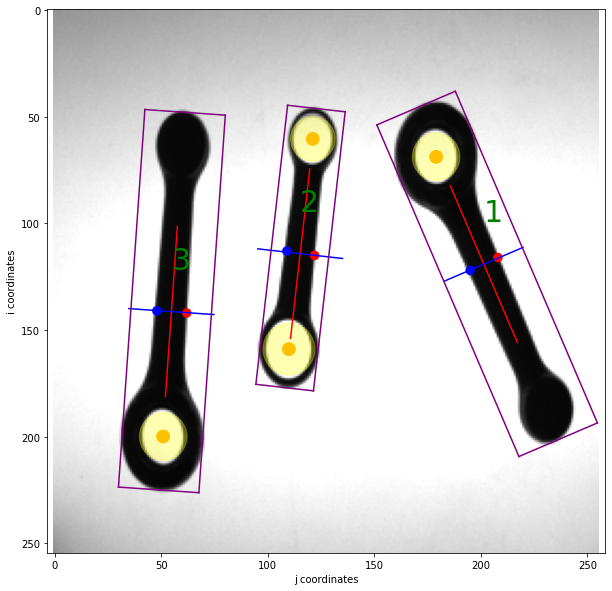



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [201, 119] -66.82  168.86  40.31    15.23
component_2    B       [115, 114]  83.44  131.74  27.20    13.15
component_3    A        [55, 141]  86.00  177.55  37.82    14.04


                 center (j,1)  diameter
hole_1_of_comp_1    [179, 69]     22.28
hole_1_of_comp_2    [121, 60]     20.94
hole_2_of_comp_2   [110, 159]     24.46
hole_1_of_comp_3    [51, 200]     22.27


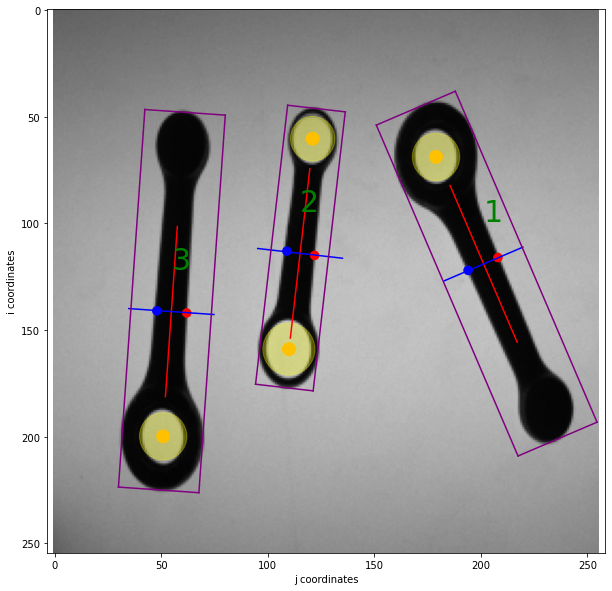



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A         [82, 82]  42.05  151.86  44.73    16.28
component_2    B       [128, 117]   3.30  100.47  35.35    17.03
component_3    A       [105, 172]   5.38  136.99  50.06    19.10


                 center (j,1)  diameter
hole_1_of_comp_1    [45, 116]     22.55
hole_1_of_comp_2   [163, 115]     24.43
hole_2_of_comp_2    [87, 119]     21.16
hole_1_of_comp_3   [150, 168]     22.88


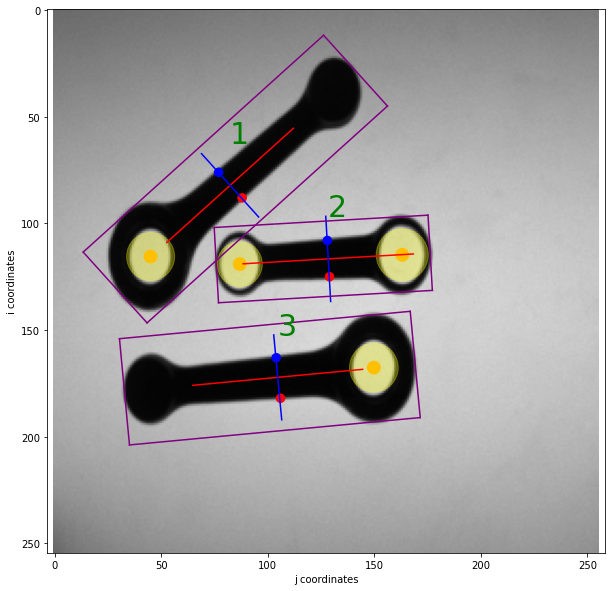



            type barycenter (j,i)  theta       L      W  W_baric
component_1    B        [114, 91]  63.79  156.58  37.12    17.89
component_2    A       [153, 162]  42.21  192.91  57.00    21.93


                 center (j,1)  diameter
hole_1_of_comp_1    [138, 45]     29.45
hole_2_of_comp_1    [84, 150]     26.73
hole_1_of_comp_2   [201, 120]     28.56


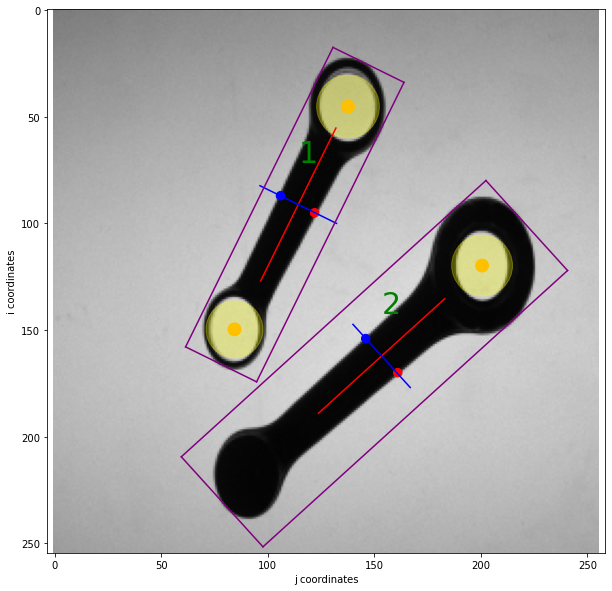



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [189, 143]  59.58  208.09  52.72    19.72
component_2    B        [86, 160]   3.03  127.40  46.04    23.02


                 center (j,1)  diameter
hole_1_of_comp_1    [224, 84]     27.92
hole_1_of_comp_2   [129, 158]     30.82
hole_2_of_comp_2    [33, 164]     26.32


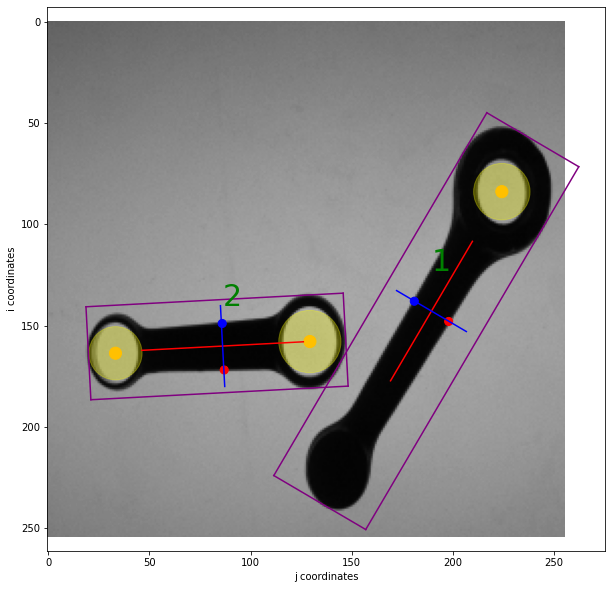



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [104, 106]  44.45  194.40  56.09    21.21
component_2    A       [155, 146]  35.09  186.97  59.37    22.20


                 center (j,1)  diameter
hole_1_of_comp_1    [150, 62]     28.30
hole_1_of_comp_2   [105, 180]     28.65


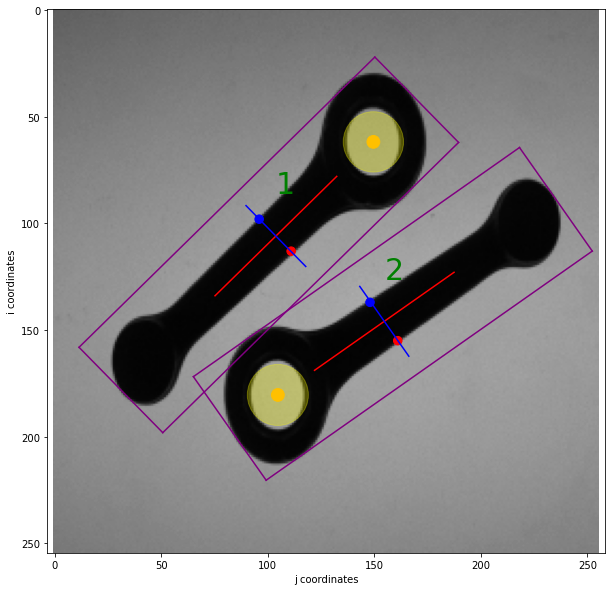



            type barycenter (j,i)  theta       L      W  W_baric
component_2    A       [162, 169] -34.58  181.61  57.26    20.25


                 center (j,1)  diameter
hole_1_of_comp_2   [212, 201]      27.0


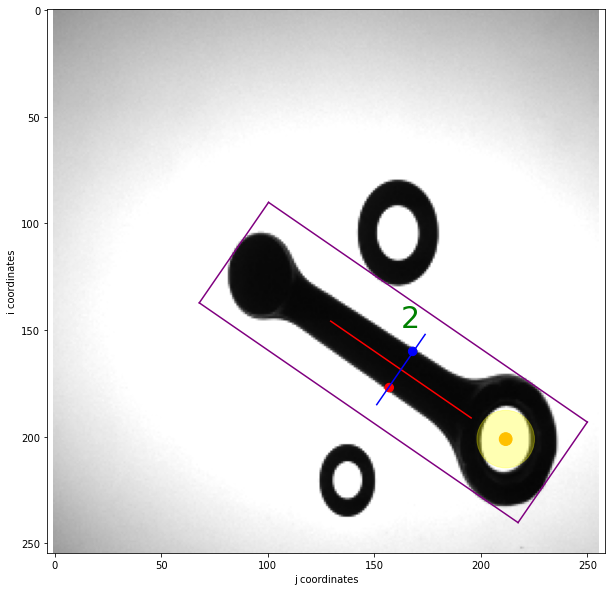



            type barycenter (j,i)  theta       L      W  W_baric
component_2    A       [166, 158] -47.33  191.74  54.09    20.52
component_3    B        [84, 175] -25.80  129.25  43.07    21.02


                 center (j,1)  diameter
hole_1_of_comp_2   [208, 203]     27.03
hole_1_of_comp_3    [44, 157]     29.06
hole_2_of_comp_3   [133, 198]     26.20


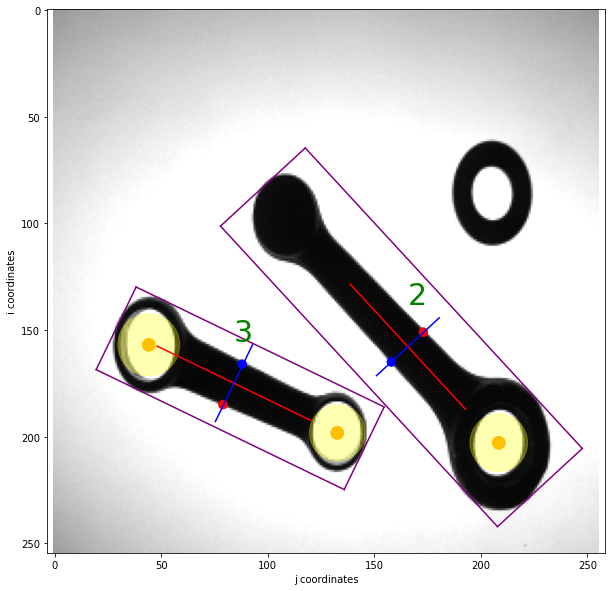



            type barycenter (j,i)  theta       L      W  W_baric
component_2    A       [165, 167] -47.17  191.64  54.11    20.52
component_3    B        [84, 175] -25.73  129.24  42.64    21.02


                 center (j,1)  diameter
hole_1_of_comp_2   [208, 212]     26.95
hole_1_of_comp_3    [44, 157]     28.97
hole_2_of_comp_3   [133, 198]     26.20


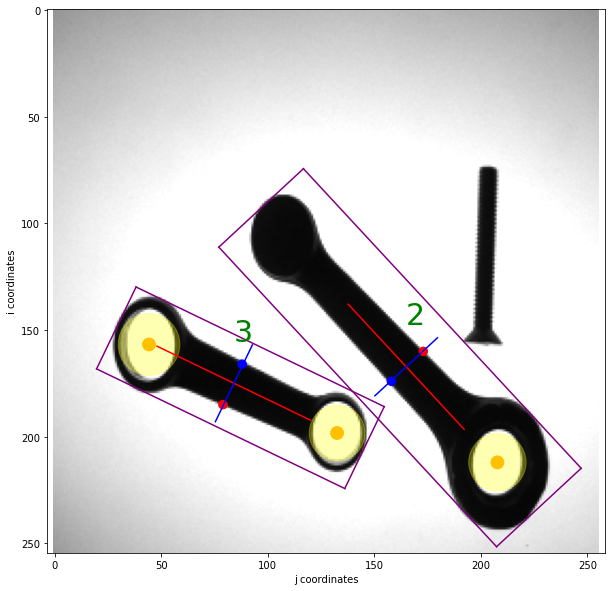



            type barycenter (j,i)  theta       L      W  W_baric
component_4    B        [84, 174] -23.18  128.42  43.07    20.62


                 center (j,1)  diameter
hole_1_of_comp_4    [44, 158]     28.74
hole_2_of_comp_4   [134, 195]     26.26


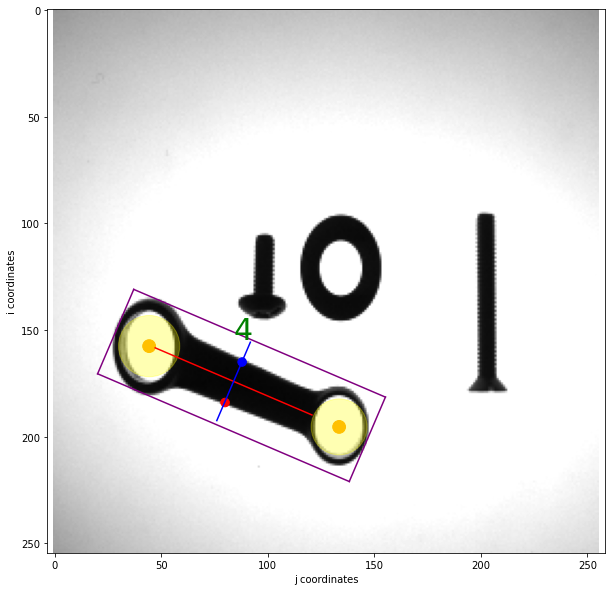



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [161, 113] -45.09  167.60  48.08    18.38
component_2    B        [81, 143] -51.91  127.84  33.97    16.40


                 center (j,1)  diameter
hole_1_of_comp_1    [121, 75]     24.55
hole_1_of_comp_2    [54, 110]     25.97
hole_2_of_comp_2   [114, 185]     23.02


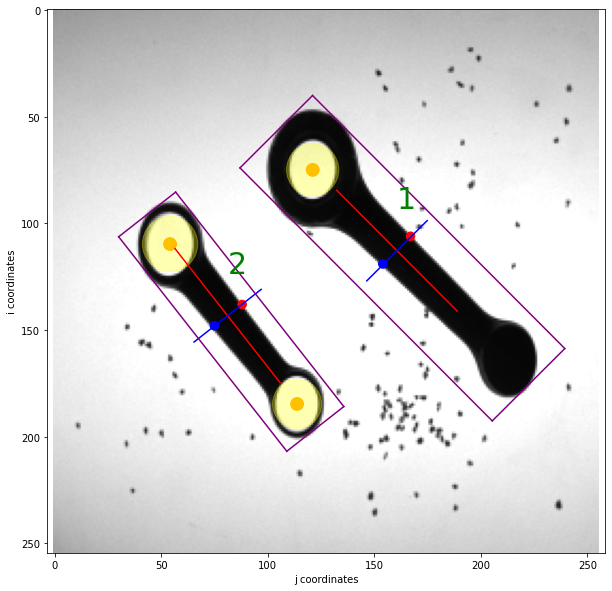



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A         [62, 99]  58.26  178.44  45.50    17.49
component_2    B       [190, 110]   6.78  110.13  38.56    19.10
component_3    A       [157, 172]  -5.21  148.39  54.32    20.10


                 center (j,1)  diameter
hole_1_of_comp_1    [31, 149]     24.28
hole_1_of_comp_2   [228, 106]     25.44
hole_2_of_comp_2   [146, 114]     22.84
hole_1_of_comp_3   [206, 176]     24.30


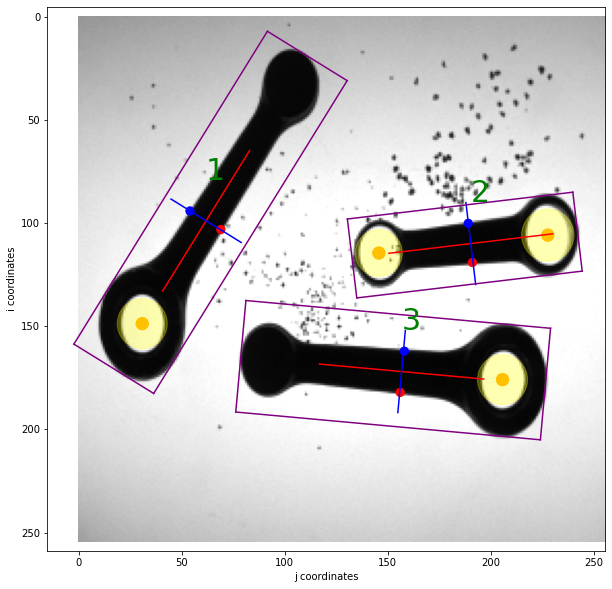



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [180, 127]  61.99  181.01  44.69    15.65
component_2    B        [76, 130] -31.19  116.82  37.19    18.87


                 center (j,1)  diameter
hole_1_of_comp_1    [208, 74]     24.05
hole_1_of_comp_2    [34, 106]     22.48
hole_2_of_comp_2   [110, 150]     26.52


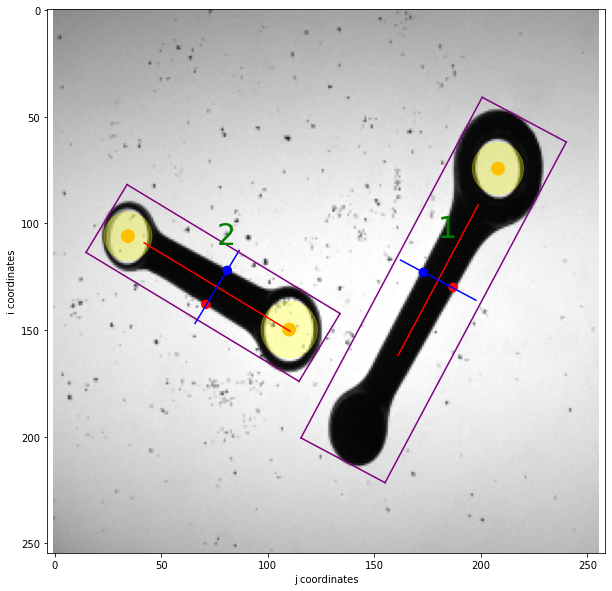

In [11]:
for idx in range(len(thresh_list)-2):
    img = thresh_list[idx]
    img_in_list = img_list[idx]
    Components_stats(img,img_in_list)

## Considerations

The solution presented above has not been designed to solve the case in which there are touching components. In addition, the need of the median filter has made the separation harder by making the area around the touching points thicker.
Therefore we decided to binarize without applying the median filter hoping that this would allow an acceptable separation with erosion without compromising too much components geometry.

Let's find the image binarization directly on the original images:

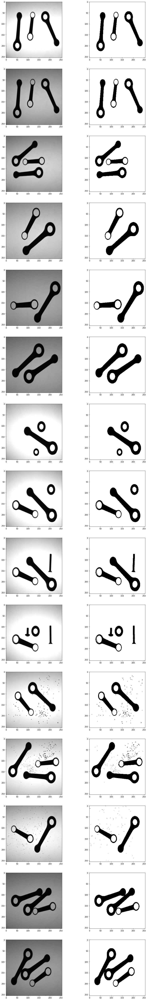

In [12]:
thresh_list_no_filter = []  # list of filtered and binarized images

fig = plt.figure(figsize=(15,100))
img_list_to_binarize = img_list.copy()

i = 1 # index for plotting images
N = len(img_list_to_binarize)  

for img in img_list_to_binarize:
# binarization
    ret,thresh = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    thresh_list_no_filter.append(thresh)  # append the filtered image

# display input image
    fig.add_subplot(N, 2, i) # rows , columns, idx
    plt.imshow(img, cmap='gray', vmin=0, vmax=255)
    i = i+1

# display binarized image
    fig.add_subplot(N, 2, i) # rows , columns, idx
    plt.imshow(thresh, cmap='gray', vmin=0, vmax=255)
    i = i+1

plt.show()

## SOLUTION FOR ALL THE THREE POSSIBLE SCENARIO USING EROSION

Unfortunatly even without applying the median, it can be seen that the area is still thick and would require many erosion for a correct separation.

Knowing that the solution based on erosion is useful to separate the different objects with the aim of counting but it provides as output corrupted shapes, we have tried to solve the problem by finding contours and then detecting with them the objects in the original image in order to get more accurate measurements.

To deal with the problem we tested several methods:
- Edge detection: hoping on the presence of a contrast in the contact point;
- Edge detection after contrast stretching: hoping to enhance a possible contrasts in the contact regions;
- Adaptive thresholding: with expected bad results;
- Hough transform to detect circles and lines: lines were well identified but there were problems with the circles;

Though, all this methos failed to properly identify the contour in the contact region because of the too small contrast between the two components. For this reason we decided to rely upon erosion just in case of touching components. 

**Solution based on erosion:**

<img src="EROSION_SC.png" width=700>

This morphology operator allows us to separate the touching components at the cost of a lower precision in the estimation of their barycenter and orientation. 
In order to detect the presence of contact points we set a lower bound on the area of the connected components detected by a first labelling.
Then we treated differently the components with area lower or higher than that bound that we estimated to be around 6000:

- Those with a lower area are analysed as in the previous case without any loss of precision.
- Those with a wider area are first eroded in order to separate them into subcomponents. Erosion has to be applied five times in order to achieve the complete separation in all the cases.

To exclude non relevant pieces created by the previous erosion or noise that was not filtered before (that as we have said would have made harder the separation), we excluded those components having an area lower than an upper bound set to 100. We have also applied once the filter to reduce the noise just enough.
Then we extracted the covariance matrix,  the major and minor axes from its eigenvectors and fianlly the orientation of each subcomponent.

As regards the holes detection and measurements, it was possible to achieve precise diameter and position estimation by labelling the background as in the standard case. Then the most tricky part was to assign them to the corresponding subcomponent.
In order to do so we relied on the distance from the major axis: each hole has been assigned to the component whose major axis is at minimum distance from the hole's centre.
This method may fail just in the case in which the major axis of one of the touching rods goes through (or passes very close to) the centre of the other rod holes.

<img src="Failing_attribution.png" width=256>

In this case, just for connected components, it was not possible to find out length, width and width at the baricenter because of the impossibility to separate whole subcomponents.

**Example of erosion adopted to separate components:**

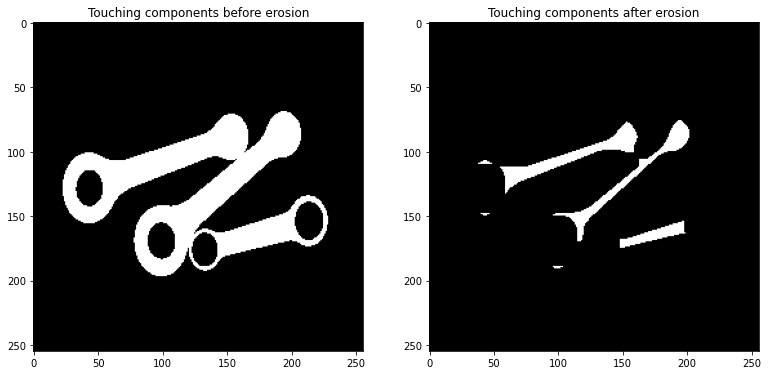

In [13]:
img = thresh_list_no_filter[13]
num_labels, labels_im = cv2.connectedComponents(255-img)
component = (labels_im == 1).astype('uint8')    # select the touching component

fig = plt.figure(figsize=(13,20))
fig.add_subplot(1, 2, 1) # rows , columns, idx
plt.imshow(component*255, cmap='gray', vmin=0, vmax=255)
plt.title('Touching components before erosion')

kernel = np.ones((3,3),dtype='int')                 # Kernel for erosion
mon_eroded = cv2.erode(component,kernel,iterations=5)

fig.add_subplot(1, 2, 2) # rows , columns, idx
plt.imshow((mon_eroded)*255, cmap='gray', vmin=0, vmax=255)
plt.title('Touching components after erosion')
plt.show()

**Implementation of the solution:**

In [14]:
UPPER_BOUND_AREA_SINGLE_COMP = 6000
LOWER_BOUND_AREA_SINGLE_COMP = 100

In [15]:
def Components_stats_con(bin_img,img_in_list):

# Connectivity definition and connected component labelling
    connectivity = 4
    num_labels, labels_im = cv2.connectedComponentsWithAlgorithm(255-bin_img,connectivity, cv2.CV_32S,-1)   #-1 is for the default algorithm of the connectivity
                                                                                                          # We insert 255-bin_img because the algorithm perform the labeling on white pixels
# Plot                                                                                                    
    fig = plt.figure(figsize=(10, 10))
    #plt.imshow(255-labels_im*255, cmap='gray', vmin=0, vmax=255)         # uncomment this line and comment the following to plot on binarized images
    plt.imshow(img_in_list, cmap='gray', vmin=0, vmax=255)                # plot of the real images
    plt.xlabel("j coordinates")
    plt.ylabel("i coordinates")
    plt.axis('equal')

# Variable definition
    kernel = np.ones((3,3),dtype='int')                 # Kernel for contour extraction
    components = []                                     # List to store separated components
    barycenters = []                                    # List to store baricenters positions
    orientations=[]                                     # List to store components orientation
    comp_type=[]                                        # List to store component type
    holes=[]                                            # List to store holes
    L_list=[]                                           # List to store component length
    W_list=[]                                           # List to store component width
    W_barycenter_list=[]                                # List to store component width at the baricenter

# List for displaying purposes 
    info_comp_list = []
    comp_numbers = []
    holes_numbers = []
    info_hole_list = []

# Iteration for each component of the image
    for lab_comp in range(1, num_labels):
        component = (labels_im == lab_comp).astype("uint8")     # Extract component with label 'lab_comp'. Component is an array of the same size of the original image and each element assumes value 0 or 1 
        y, x= np.nonzero(component)                             # Extract non zero elements of the component (np.nonzero returns first the row coord (y=i) then the column (x=j))
        area = len(x)                                           # The number of non zero pixels is equal to the area (len(x)=len(y)=area)
    
        if (area > UPPER_BOUND_AREA_SINGLE_COMP):               # Used to select touching components       
            # Erosion to separate the subcomponents
            mon_eroded = cv2.erode(component,kernel,iterations=5)
            num_subc, labels_subc = cv2.connectedComponentsWithAlgorithm(mon_eroded,connectivity, cv2.CV_32S,-1)
            count=0
            for lab_sub_comp in range (1,num_subc):                            # Iterate on the subcomponents found
                sub_component = (labels_subc == lab_sub_comp).astype("uint8") 
                y_subc, x_subc= np.nonzero(sub_component)                      # Extract non zero elements of the component (np.nonzero returns first the row coord (y=i) then the column (x=j))
                area_sub = len(x_subc)
                if(area_sub>LOWER_BOUND_AREA_SINGLE_COMP):                     # Filtering out possible unwanted fragments
                    # Extraction of baricenter, major, minor axis of subcomponents
                    count=count+1
                    barycenter,theta,eigvec_major,eigvec_minor,eigval_ratio=find_pos(x_subc,y_subc)
                    j_b,i_b = barycenter

                    components.append(sub_component)
                    comp_numbers.append('component_'+str(len(components)))                    # This will be the row index of the DataFrame

                    orientations.append(theta)      # We assume theta to be positive in counterclockwise direction
                    barycenters.append(np.array(barycenter).round().astype('int'))

                    scale = 20
                    plt.plot([eigvec_major[0]*scale*2+j_b, eigvec_major[0]*-scale*2+j_b],
                        [eigvec_major[1]*scale*2+i_b, eigvec_major[1]*-scale*2+i_b], color='red')
                    plt.plot([eigvec_minor[0]*scale+j_b, eigvec_minor[0]*-scale+j_b],
                        [eigvec_minor[1]*scale+i_b, eigvec_minor[1]*-scale+i_b], color='blue')
                    plt.text(j_b,i_b-20, len(components), fontdict=None,color='green',fontsize='30')
                     
                    L_list.append(NaN)              # add dummy info to lists since it is not accurate to measure dimensions on eroded subcomponents
                    W_list.append(NaN)
                    W_barycenter_list.append(NaN)
                    
            # Holes labeling (of those inside the touching component) and association holes-major axis.  
            num_labels_back, labeled_hole=cv2.connectedComponents((1-component), connectivity=8)      # Background labeling   
            count_holes_sub=np.zeros(count)

            for lab_hole in range (2,num_labels_back):                                       # Iteration for holes
                hole = (labeled_hole == lab_hole).astype("uint8")
                holes.append(hole)
                y_hole, x_hole = np.nonzero(hole)
                area_hole = len(x_hole)
                j_centre = np.sum(x_hole)/area_hole
                i_centre = np.sum(y_hole)/area_hole

                # Hole outer contour
                hole_dilated = cv2.dilate(hole,kernel,iterations=1)
                outer_contour_hole = hole - hole_dilated
                y_hole_outer, x_hole_outer = np.nonzero(outer_contour_hole)
                dist_centre_outer = np.sqrt((x_hole_outer-j_centre)**2+(y_hole_outer-i_centre)**2)
                radius_outer = np.mean(dist_centre_outer)

                # Hole inner contour
                hole_eroded = cv2.erode(hole,kernel,iterations=1)
                inner_contour_hole = hole - hole_eroded
                y_hole_inner, x_hole_inner = np.nonzero(inner_contour_hole)
                dist_centre_inner = np.sqrt((x_hole_inner-j_centre)**2+(y_hole_inner-i_centre)**2)
                radius_inner = np.mean(dist_centre_inner)

                # We take the radius as the mean between those found with inner and outer contour to be more precise
                radius = (radius_outer + radius_inner)/2
                diameter = 2*radius
                circle_area = plt.Circle((j_centre, i_centre), radius, color='yellow',alpha=0.3)
                circle_centre = plt.Circle((j_centre, i_centre), 3, color='orange')
                centre = np.array([j_centre, i_centre]).round().astype('int')                   # We round and cast to int the centre coordinates(after having used it for computations) to obtain pixels coordinates
                info_holes = [centre, diameter]
                info_hole_list.append(info_holes)

                plt.text(j_centre+5,i_centre+5, lab_hole-1, fontdict=None,color='pink',fontsize='10')

                plt.gca().add_patch(circle_centre)
                plt.gca().add_patch(circle_area)

                # Associate holes to major axis based on distance
                a_maj = -np.sin(orientations[-count :])                #vector of all subconponents eigvec_major[0] 
                b_maj = -np.cos(orientations[-count :])                #vector of all subconponents eigvec_major[1]
                j_baricenters_all_holes = np.array(barycenters)[-count :,0]
                i_baricenters_all_holes= np.array(barycenters)[-count :,1]
                c_maj = -(a_maj*j_baricenters_all_holes + b_maj*i_baricenters_all_holes)   # baricenters_all_holes[0]= vector of baricenters j coordinate
                                                                                           # baricenters_all_holes[1]= vector of baricenters i coordinate
                    
                # Signed distance from major axis
                dist_maj = (a_maj*j_centre+b_maj*i_centre+c_maj)/(a_maj**2+b_maj**2)       # vector of distances

                relative_index=np.argmin(np.abs(dist_maj))                                 # find index of the component whose major axis is at minimum distance from the hole centre analyzed now                             
                absolute_index=len(components)-count+relative_index
                count_holes_sub[relative_index]=count_holes_sub[relative_index]+1          # increment number of holes associated to the component of index 'absolute_index'

                holes_numbers.append('hole_'+str(lab_hole-1)+'_of_comp_'+str(absolute_index+1))

            for rel_idx in range (count):
                if(count_holes_sub[rel_idx]==1):                                                      
                    type_='A'                                                                                                                         
                elif(count_holes_sub[rel_idx]==2):
                    type_='B'
                else:
                    type_='C'                        # Type for distractor
                comp_type.append(type_)              # Add type to the list

        elif(area>LOWER_BOUND_AREA_SINGLE_COMP):                                      # Selecting non touching components 
            components.append(component)                                              # Add component to list
            comp_numbers.append('component_'+str(len(components)))                    # This will be the row index of the DataFrame
            barycenter,theta,eigvec_major,eigvec_minor,eigval_ratio=find_pos(x,y)
            j_b,i_b = barycenter
            barycenters.append(np.array(barycenter).round().astype('int'))                   # Store barycenter coord. as tuples

            # Number of holes extraction
            num_labels_back, labeled_hole=cv2.connectedComponents((1-component)*255, connectivity=4)      # Background labeling
            num_holes=num_labels_back-2         # We subtract two becuase the function connected component count even the background and the object, not relevant for us in this case

            # Classification of the object
            if(num_holes==1 and (eigval_ratio<0.2) ):    # we set an upperbound on the eigenvaues ratio to distinguish the rod with one holes from the washer.                                                      
                type_='A'                                # Indeed we expect this ratio to be close to one in the case of washers                                                         
            elif(num_holes==2):
                type_='B'
            else:
                type_='C'                        # Type for distractor
                theta=NaN                        # We initialize dimensions to NaN for distractors
                L=NaN
                W=NaN
                W_barycenter=NaN
            comp_type.append(type_)              # Add type to the list
      
            # Orientation and axes plot
            orientations.append(theta)           # We assume theta to be positive in counterclockwise direction
            if(type_!='C'):                      # We select only object of interest
                scale = 20
                plt.plot([eigvec_major[0]*scale*2+j_b, eigvec_major[0]*-scale*2+j_b],
                      [eigvec_major[1]*scale*2+i_b, eigvec_major[1]*-scale*2+i_b], color='red')
                plt.plot([eigvec_minor[0]*scale+j_b, eigvec_minor[0]*-scale+j_b],
                      [eigvec_minor[1]*scale+i_b, eigvec_minor[1]*-scale+i_b], color='blue')
                plt.text(j_b,i_b-20, len(components), fontdict=None,color='green',fontsize='30')

                # Contour
                comp_eroded = cv2.erode(component,kernel,iterations=1)
                inner_contour = component - comp_eroded
                y_contour,x_contour = np.nonzero(inner_contour)

                # Distances
                L,W,W_barycenter = Object_Oriented_BB(eigvec_major,eigvec_minor,barycenter,x_contour,y_contour)   # We call the function

                # Recap information in a list that then will be displayed as a pandas DataFrame
                barycenter = np.array(barycenter).round().astype('int')                   # Since the pixel are discrete quantities we set baricenter coordinates to be integer
        
                # Holes position and diameter
                for lab_hole in range (2,num_labels_back):                                # Iteration for holes
                    hole = (labeled_hole == lab_hole).astype("uint8")
                    holes.append(hole)
                    y_hole, x_hole = np.nonzero(hole)
                    area_hole = len(x_hole)
                    j_centre = np.sum(x_hole)/area_hole
                    i_centre = np.sum(y_hole)/area_hole

                    # Hole outer contour
                    hole_dilated = cv2.dilate(hole,kernel,iterations=1)
                    outer_contour_hole = hole - hole_dilated
                    y_hole_outer, x_hole_outer = np.nonzero(outer_contour_hole)

                    dist_centre_outer = np.sqrt((x_hole_outer-j_centre)**2+(y_hole_outer-i_centre)**2)
                    radius_outer = np.mean(dist_centre_outer)

                    # Hole inner contour
                    hole_eroded = cv2.erode(hole,kernel,iterations=1)
                    inner_contour_hole = hole - hole_eroded
                    y_hole_inner, x_hole_inner = np.nonzero(inner_contour_hole)
                    dist_centre_inner = np.sqrt((x_hole_inner-j_centre)**2+(y_hole_inner-i_centre)**2)
                    radius_inner = np.mean(dist_centre_inner)

                    # We take the radius as the mean between those found with inner and outer contour to be more precise
                    radius = (radius_outer + radius_inner)/2
                    diameter = 2*radius
                    circle_area = plt.Circle((j_centre, i_centre), radius, color='yellow',alpha=0.3)
                    circle_centre = plt.Circle((j_centre, i_centre), 3, color='orange')
                    centre = np.array([j_centre, i_centre]).round().astype('int')
                    info_holes = [centre, diameter]
                    info_hole_list.append(info_holes)
                    holes_numbers.append('hole_'+str(lab_hole-1)+'_of_comp_'+str(len(components)))

                    plt.gca().add_patch(circle_centre)
                    plt.gca().add_patch(circle_area)

            L_list.append(L)                        # add info to lists
            W_list.append(W)
            W_barycenter_list.append(W_barycenter)
        
    # display information as a dataframe
    info_df = pd.DataFrame(columns = ['type','barycenter (j,i)','theta','L','W','W_baric'], index=comp_numbers)
    info_df['type']=comp_type
    info_df['barycenter (j,i)']=barycenters
    info_df['theta']=np.array(orientations)*180/np.pi
    info_df['L']=L_list
    info_df['W']=W_list
    info_df['W_baric']=W_barycenter_list
    print(np.round(info_df, decimals=2))
    print('\n')

    info_holes_df = pd.DataFrame(info_hole_list, columns = ['center (j,1)','diameter'], index=holes_numbers)
    print(np.round(info_holes_df, decimals=2))
                                      # the rounding will affect only the values displayed without changing the values in the DataFrame
    plt.show()
    print('\n')

    return (0)

            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [201, 119] -66.81  169.25  40.05    14.32
component_2    B       [115, 114]  83.51  131.74  27.19    13.15
component_3    A        [55, 141]  86.00  177.55  37.82    14.04


                 center (j,1)  diameter
hole_1_of_comp_1    [179, 69]     22.37
hole_1_of_comp_2    [121, 60]     20.99
hole_2_of_comp_2   [110, 159]     24.43
hole_1_of_comp_3    [51, 200]     22.36


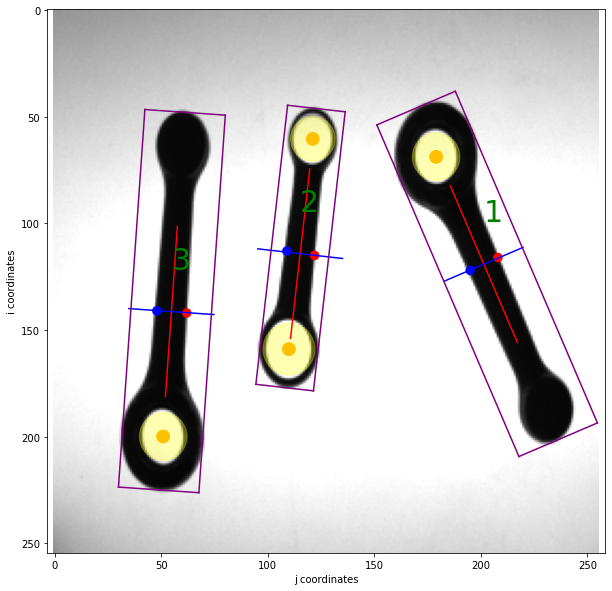



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [201, 119] -66.82  168.86  40.31    15.23
component_2    B       [115, 114]  83.44  131.74  27.20    13.15
component_3    A        [55, 141]  86.00  177.55  37.82    14.04


                 center (j,1)  diameter
hole_1_of_comp_1    [179, 69]     22.28
hole_1_of_comp_2    [121, 60]     20.94
hole_2_of_comp_2   [110, 159]     24.46
hole_1_of_comp_3    [51, 200]     22.27


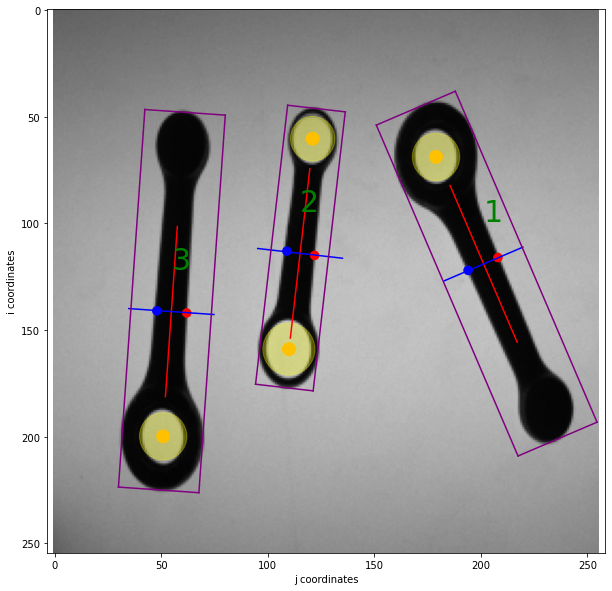



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A         [82, 82]  42.05  151.86  44.73    16.28
component_2    B       [128, 117]   3.30  100.47  35.35    17.03
component_3    A       [105, 172]   5.38  136.99  50.06    19.10


                 center (j,1)  diameter
hole_1_of_comp_1    [45, 116]     22.55
hole_1_of_comp_2   [163, 115]     24.43
hole_2_of_comp_2    [87, 119]     21.16
hole_1_of_comp_3   [150, 168]     22.88


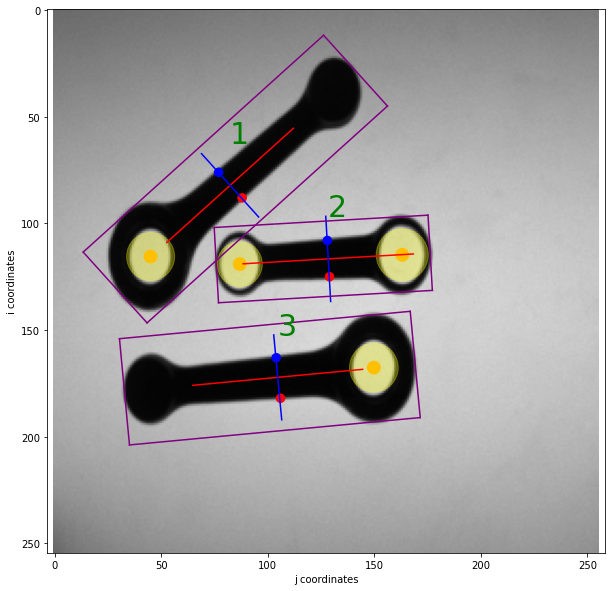



            type barycenter (j,i)  theta       L      W  W_baric
component_1    B        [114, 91]  63.78  156.58  37.12    17.89
component_2    A       [153, 162]  42.21  192.91  57.00    21.93


                 center (j,1)  diameter
hole_1_of_comp_1    [138, 45]     29.50
hole_2_of_comp_1    [84, 150]     26.73
hole_1_of_comp_2   [201, 120]     28.56


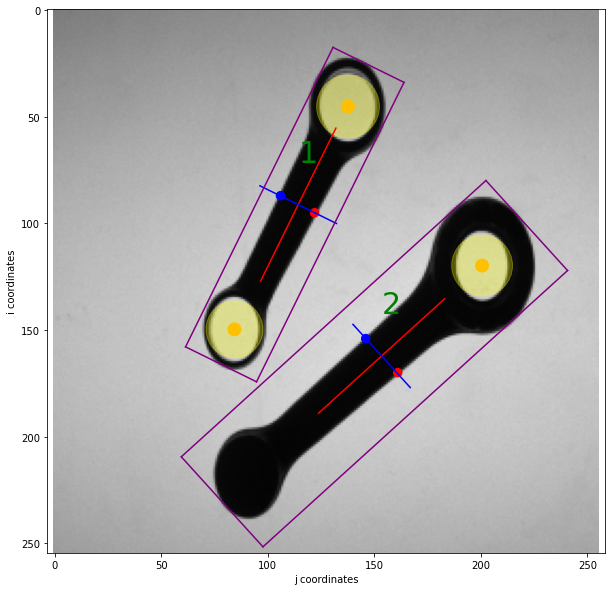



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [189, 143]  59.58  208.09  52.72    19.72
component_2    B        [86, 160]   3.03  127.40  46.04    23.02


                 center (j,1)  diameter
hole_1_of_comp_1    [224, 84]     27.92
hole_1_of_comp_2   [129, 158]     30.82
hole_2_of_comp_2    [33, 164]     26.32


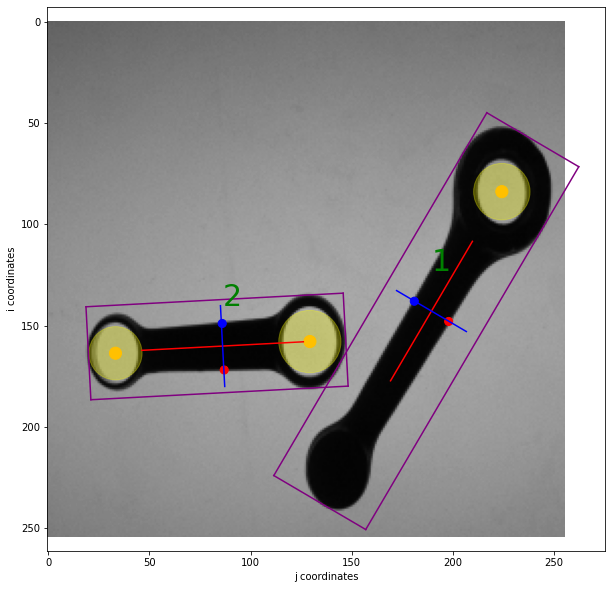



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [104, 106]  44.45  194.40  56.09    21.21
component_2    A       [155, 146]  35.09  186.97  59.37    22.20


                 center (j,1)  diameter
hole_1_of_comp_1    [150, 62]     28.30
hole_1_of_comp_2   [105, 180]     28.65


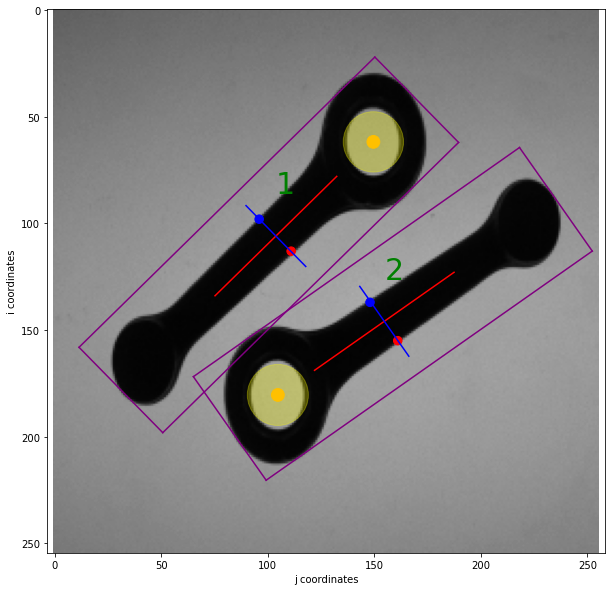



            type barycenter (j,i)  theta       L      W  W_baric
component_1    C       [161, 104]    NaN     NaN    NaN      NaN
component_2    A       [162, 169] -34.58  181.61  57.26    20.25
component_3    C       [137, 221]    NaN     NaN    NaN      NaN


                 center (j,1)  diameter
hole_1_of_comp_2   [212, 201]      27.0


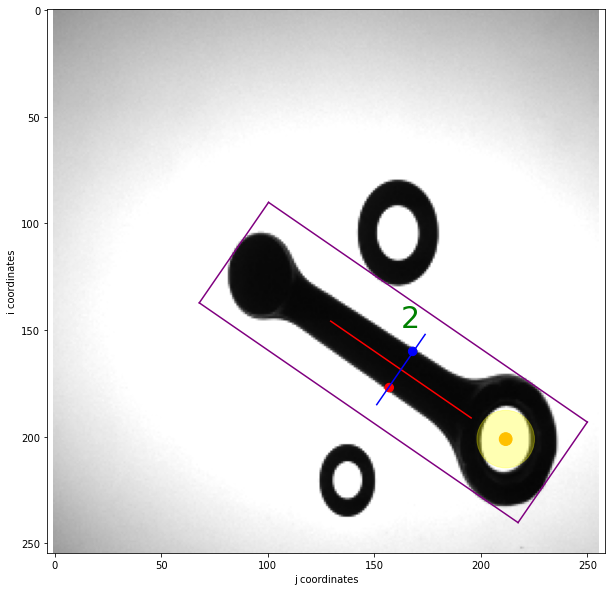



            type barycenter (j,i)  theta       L      W  W_baric
component_1    C        [206, 86]    NaN     NaN    NaN      NaN
component_2    A       [166, 158] -47.33  191.74  54.09    20.52
component_3    B        [84, 175] -25.79  129.25  43.07    21.02


                 center (j,1)  diameter
hole_1_of_comp_2   [208, 203]     27.03
hole_1_of_comp_3    [44, 157]     29.08
hole_2_of_comp_3   [133, 198]     26.20


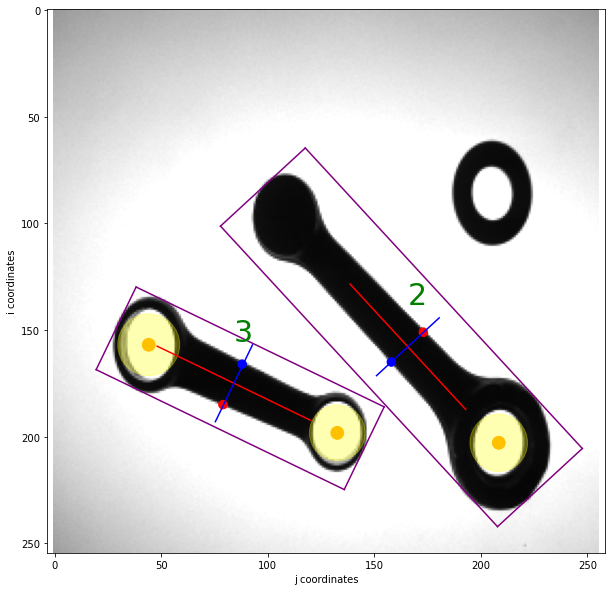



            type barycenter (j,i)  theta       L      W  W_baric
component_1    C       [202, 117]    NaN     NaN    NaN      NaN
component_2    A       [165, 167] -47.17  191.64  54.11    20.52
component_3    B        [84, 175] -25.74  129.24  42.64    21.47


                 center (j,1)  diameter
hole_1_of_comp_2   [208, 212]     26.95
hole_1_of_comp_3    [44, 157]     29.01
hole_2_of_comp_3   [133, 198]     26.20


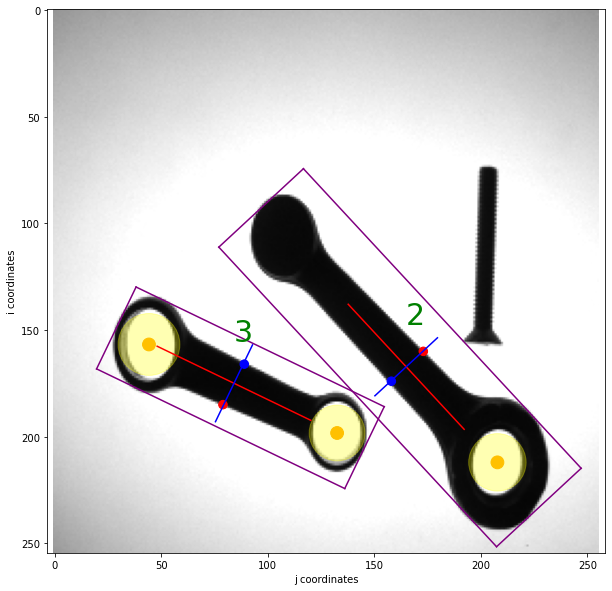



            type barycenter (j,i)  theta       L      W  W_baric
component_1    C       [203, 139]    NaN     NaN    NaN      NaN
component_2    C       [135, 121]    NaN     NaN    NaN      NaN
component_3    C        [98, 128]    NaN     NaN    NaN      NaN
component_4    B        [84, 174] -23.18  128.42  43.07    20.62


                 center (j,1)  diameter
hole_1_of_comp_4    [44, 158]     28.75
hole_2_of_comp_4   [134, 195]     26.26


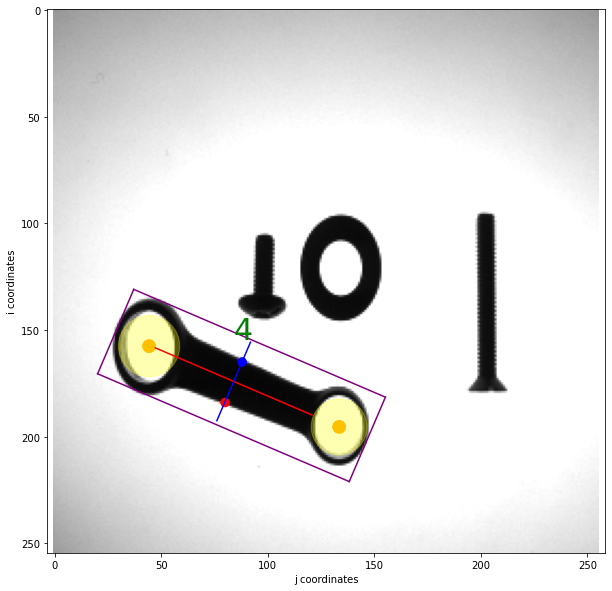



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [161, 113] -45.09  167.60  48.08    18.38
component_2    B        [81, 143] -51.91  127.84  33.97    16.40


                 center (j,1)  diameter
hole_1_of_comp_1    [121, 75]     24.55
hole_1_of_comp_2    [54, 110]     25.97
hole_2_of_comp_2   [114, 185]     23.02


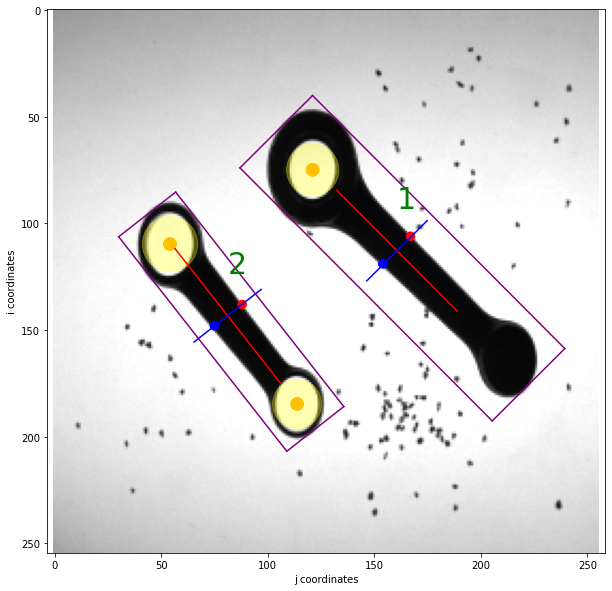



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A         [62, 99]  58.26  178.44  45.50    17.49
component_2    B       [190, 110]   6.80  110.25  38.56    19.10
component_3    A       [157, 172]  -5.21  148.39  54.32    20.10


                 center (j,1)  diameter
hole_1_of_comp_1    [31, 149]     24.28
hole_1_of_comp_2   [228, 106]     25.44
hole_2_of_comp_2   [146, 114]     22.82
hole_1_of_comp_3   [206, 176]     24.30


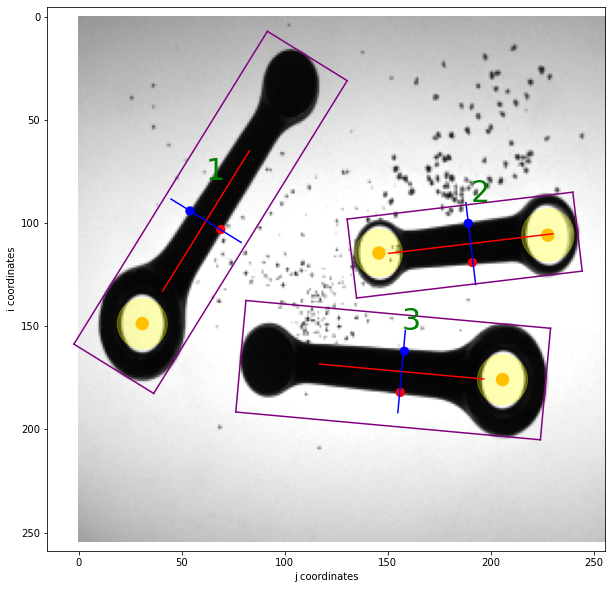



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [180, 127]  61.99  181.01  44.69    15.65
component_2    B        [76, 130] -31.19  116.82  37.19    18.87


                 center (j,1)  diameter
hole_1_of_comp_1    [208, 74]     24.05
hole_1_of_comp_2    [34, 106]     22.48
hole_2_of_comp_2   [110, 150]     26.52


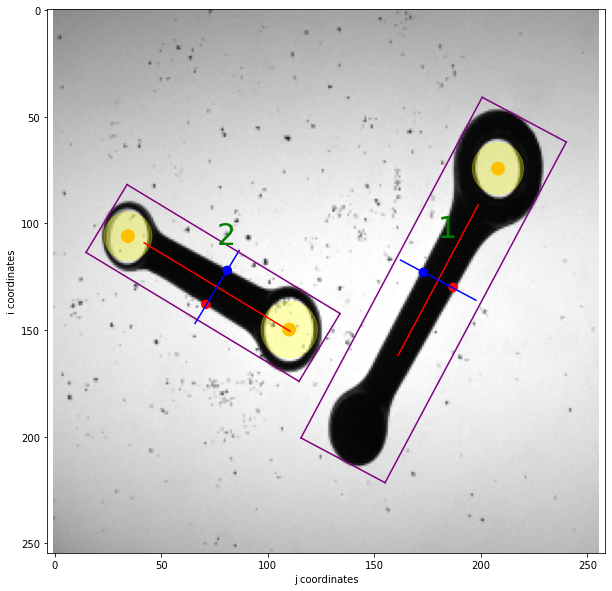



            type barycenter (j,i)  theta   L   W  W_baric
component_1    A       [156, 120]  40.97 NaN NaN      NaN
component_2    A       [111, 104]  18.38 NaN NaN      NaN
component_3    B       [174, 164]  15.45 NaN NaN      NaN


                 center (j,1)  diameter
hole_1_of_comp_2    [43, 128]     24.37
hole_2_of_comp_3   [214, 154]     25.98
hole_3_of_comp_1    [99, 169]     24.95
hole_4_of_comp_3   [133, 176]     23.18


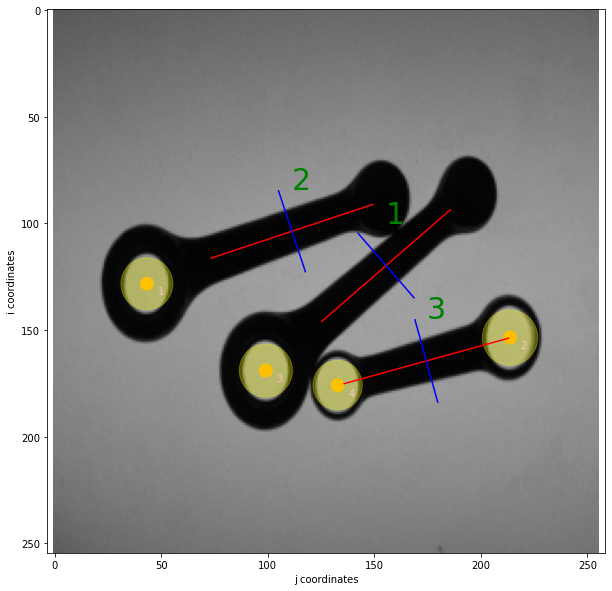



            type barycenter (j,i)  theta       L     W  W_baric
component_1    A       [148, 112]  34.69     NaN   NaN      NaN
component_2    A        [61, 143]  62.17     NaN   NaN      NaN
component_3    B       [159, 169]  37.81  119.89  35.8     17.2


                 center (j,1)  diameter
hole_1_of_comp_2    [100, 66]     24.41
hole_2_of_comp_1    [88, 157]     24.85
hole_1_of_comp_3   [192, 144]     26.25
hole_2_of_comp_3   [120, 198]     22.98


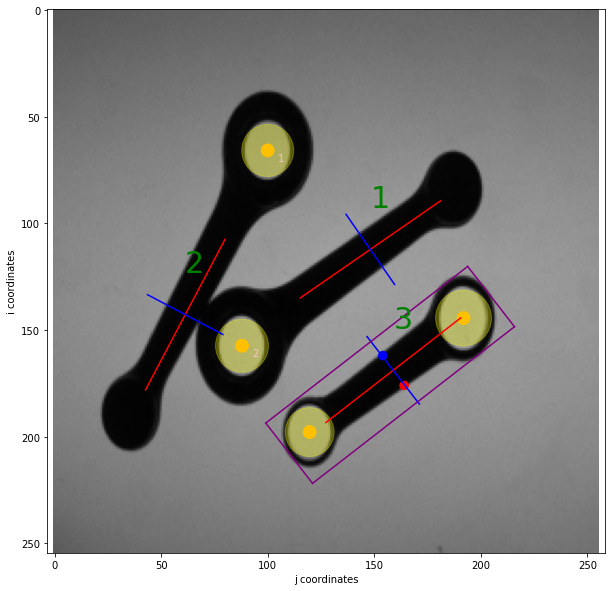

In [16]:
for img in img_list:
    ret,thresh = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    input = cv2.medianBlur(thresh,3)    # We apply one median filter to reduce the noise just enough without making too thick possible contact area
    Components_stats_con(input,img)

# SOLUTION WITH OPENING

<img src="OPENING_SC.png" width=700>

This soultion provides a more accurate approximation of baricenter position and allows also to measure the width at the baricenter for the connected rods. However it is base on some notion of the objects: indeed if the dimension of the two ends of each rod is more or less known and is greater than the width of the middle part of the rods, it is possible to apply the opening morphology operator in order to identify the heads.
Knowing the shape of the objects, we are sure that in the contacts point there will be at least an head, so by subracting to the components the head extracted, it is possible to get the entire middle part of the rods. We can therefore obtain a better position and orientation estimation than the one obtained with eroded pieces. Selecting the entire middle part, it is also possible to compute the width at the baricenter with the same method adopted in the solution with no contact points.

Opening must be applied to the filled components where holes appear as foreground.

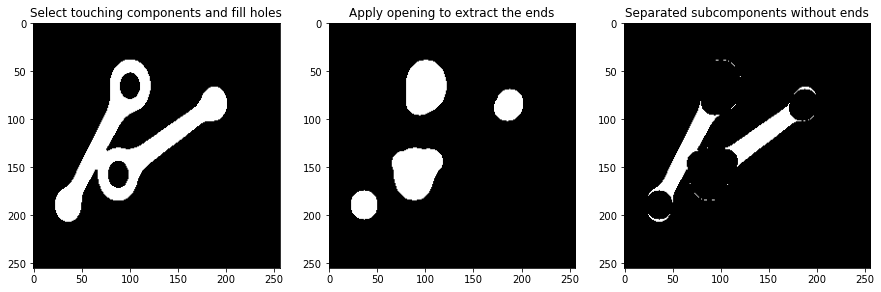

In [17]:
img = thresh_list[14]
num_labels, labels_im = cv2.connectedComponents(255-img)
component = (labels_im == 1).astype('uint8')    # select the touching component

num_hole, labels_hole = cv2.connectedComponents(1-component)  #find holes belonging to the blob of touching components

sum_of_holes = (labels_hole>1).astype('uint8')

component_filled = component+sum_of_holes

fig = plt.figure(figsize=(15,20))
fig.add_subplot(1, 3, 1) # rows , columns, idx
plt.imshow(component*255, cmap='gray', vmin=0, vmax=255)
plt.title('Select touching components and fill holes')

# estimating the minimum circle radius to be around 27 and that the width of the middle part is lower then 27
kernel_small = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(27,27))
opening_small = cv2.morphologyEx(component_filled, cv2.MORPH_OPEN, kernel_small)

fig.add_subplot(1, 3, 2)
plt.imshow((opening_small)*255, cmap='gray', vmin=0, vmax=255)
plt.title('Apply opening to extract the ends')


comp_without_ends = component_filled - opening_small #- opening_big
fig.add_subplot(1, 3, 3)
plt.imshow((comp_without_ends)*255, cmap='gray', vmin=0, vmax=255)
plt.title('Separated subcomponents without ends')
plt.show()

In [18]:
def Components_stats_open(bin_img,img_in_list):

    # Connectivity definition and connected component labelling
    connectivity = 4
    num_labels, labels_im = cv2.connectedComponentsWithAlgorithm(255-bin_img,connectivity, cv2.CV_32S,-1)   #-1 is for the default algorithm of the connectivity
                                                                                                          # We insert 255-bin_img because the algorithm perform the labeling on white pixels
# Plot                                                                                                    
    fig = plt.figure(figsize=(10, 10))
    #plt.imshow(255-labels_im*255, cmap='gray', vmin=0, vmax=255)         # uncomment this line and comment the following to plot on binarized images
    plt.imshow(img_in_list, cmap='gray', vmin=0, vmax=255)                # plot of the real images
    plt.xlabel("j coordinates")
    plt.ylabel("i coordinates")
    plt.axis('equal')

# Variable definition
    kernel = np.ones((3,3),dtype='int')                 # Kernel for contour extraction
    components = []                                     # List to store separated components
    barycenters = []                                    # List to store baricenters positions
    orientations=[]                                     # List to store components orientation
    comp_type=[]                                        # List to store component type
    L_list=[]                                           # List to store component length
    W_list=[]                                           # List to store component width
    W_barycenter_list = []                              # List to store component width at the barycenter
    holes=[]                                            # List to store holes

    # List for displaying purposes 
    info_comp_list = []
    comp_numbers = []
    holes_numbers = []
    info_hole_list = []

# Iteration for each component of the image
    for lab_comp in range(1, num_labels):
    
        component = (labels_im == lab_comp).astype("uint8")     # Extract component with label 'lab_comp'. Component is an array of the same size of the original image and each element assumes value 0 or 1  
        y, x= np.nonzero(component)                      # Extract non zero elements of the component (np.nonzero returns first the row coord (y=i) then the column (x=j))
        area = len(x)                                    # The number of non zero pixels is equal to the area (len(x)=len(y)=area)
        if (area > UPPER_BOUND_AREA_SINGLE_COMP):        # Selection of connected component

            # Holes labeling and filling of component before opening
            num_labels_back, labeled_hole=cv2.connectedComponents((1-component), connectivity=8)      # Background labeling   
            sum_of_holes = (labeled_hole>1).astype('uint8')                                           # Union of all tho holes inside the connected component
            component_filled = component+sum_of_holes                                                 # Connected component without holes ready for opening

            # Apply opening to delete circles in which contact points may be present 
            kernel_small = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(27,27))                       # kernel for opening: estimated as a circle with radius 27 based on the sample images
            opening_small = cv2.morphologyEx(component_filled, cv2.MORPH_OPEN, kernel_small)          # opening

            rod_without_ends = component_filled - opening_small                                       # subtract to cancel possible contact points

            num_subc, labels_subc = cv2.connectedComponentsWithAlgorithm(rod_without_ends,connectivity, cv2.CV_32S,-1)  # extract rod middle parts
            count=0          # counter to count the actual number of subcomponents
      
            for lab_sub_comp in range (1,num_subc):
                sub_component = (labels_subc == lab_sub_comp).astype("uint8") 
                y_subc, x_subc= np.nonzero(sub_component)                      # Extract non zero elements of the subcomponent (np.nonzero returns first the row coord (y=i) then the column (x=j))
                area_sub = len(x_subc)
                if(area_sub>LOWER_BOUND_AREA_SINGLE_COMP):                     # filtering out possible unwanted fragments
                    count=count+1                                              # count number of relevant subcomponents
                    components.append(sub_component)                           # add subcomponent to list
                    comp_numbers.append('component_'+str(len(components)))     # This will be the row index of the DataFrame

                    # Extraction of major, minor axis of subcomponents
                    barycenter,theta,eigvec_major,eigvec_minor,eigval_ratio = find_pos(x_subc,y_subc)   # call to the function implemented above
                    j_b,i_b = barycenter

                    orientations.append(theta)                                   # We assume theta to be positive in counterclockwise direction
                    barycenters.append(np.array(barycenter).round().astype('int'))

                    # Plot axes
                    scale = 20
                    plt.plot([eigvec_major[0]*scale*2+j_b, eigvec_major[0]*-scale*2+j_b],
                        [eigvec_major[1]*scale*2+i_b, eigvec_major[1]*-scale*2+i_b], color='red')
                    plt.plot([eigvec_minor[0]*scale+j_b, eigvec_minor[0]*-scale+j_b],
                        [eigvec_minor[1]*scale+i_b, eigvec_minor[1]*-scale+i_b], color='blue')
                    plt.text(j_b,i_b-20, len(components), fontdict=None,color='green',fontsize='30')

                    # Contour extraction to speed up the computation of Object_Oriented_BB
                    comp_eroded = cv2.erode(sub_component,kernel,iterations=1)
                    inner_contour = sub_component - comp_eroded
                    y_contour,x_contour = np.nonzero(inner_contour)

                    # Distances
                    L,W,W_barycenter = Object_Oriented_BB(eigvec_major,eigvec_minor,barycenter,x_contour,y_contour,connected=True)   # We call the function on the middle rod part     
                    L_list.append(L)                        # add info to lists
                    W_list.append(W)
                    W_barycenter_list.append(W_barycenter)


            count_holes_sub=np.zeros(count)

            for lab_hole in range (2,num_labels_back):                                       # Iteration for holes
                hole = (labeled_hole == lab_hole).astype("uint8")
                holes.append(hole)
                y_hole, x_hole = np.nonzero(hole)
                area_hole = len(x_hole)
                j_centre = np.sum(x_hole)/area_hole
                i_centre = np.sum(y_hole)/area_hole

                # Hole outer contour
                hole_dilated = cv2.dilate(hole,kernel,iterations=1)
                outer_contour_hole = hole - hole_dilated
                y_hole_outer, x_hole_outer = np.nonzero(outer_contour_hole)
                dist_centre_outer = np.sqrt((x_hole_outer-j_centre)**2+(y_hole_outer-i_centre)**2)
                radius_outer = np.mean(dist_centre_outer)

                # Hole inner contour
                hole_eroded = cv2.erode(hole,kernel,iterations=1)
                inner_contour_hole = hole - hole_eroded
                y_hole_inner, x_hole_inner = np.nonzero(inner_contour_hole)
                dist_centre_inner = np.sqrt((x_hole_inner-j_centre)**2+(y_hole_inner-i_centre)**2)
                radius_inner = np.mean(dist_centre_inner)

                # We take the radius as the mean between those found with inner and outer contour to be more precise
                radius = (radius_outer + radius_inner)/2
                diameter = 2*radius
                circle_area = plt.Circle((j_centre, i_centre), radius, color='yellow',alpha=0.3)
                circle_centre = plt.Circle((j_centre, i_centre), 3, color='orange')
                centre = np.array([j_centre, i_centre]).round().astype('int')

                # Add info to list for displaying purposes   
                info_holes = [centre, diameter]
                info_hole_list.append(info_holes)
                # Plot circle number for a better comprehension of the hole-subcomponent association 
                plt.text(j_centre+5,i_centre+5, lab_hole-1, fontdict=None,color='pink',fontsize='10')
                # Draw circle
                plt.gca().add_patch(circle_centre)
                plt.gca().add_patch(circle_area)

                # Associate holes to major axis based on distance
                a_maj = -np.sin(orientations[-count :])                                     # vector of all sub conponents eigvec_major[0] computed from the knowledge of theta  
                b_maj = -np.cos(orientations[-count :])                                     # vector of all sub conponents eigvec_major[1] computed from the knowledge of theta
                j_baricenters_all_holes = np.array(barycenters)[-count :,0]                 # vector of j coordinates of the baricenters of all sub conponents
                i_baricenters_all_holes= np.array(barycenters)[-count :,1]                  # vector of i coordinates of the baricenters of all sub conponents
                c_maj = -(a_maj*j_baricenters_all_holes + b_maj*i_baricenters_all_holes)    # baricenters_all_holes[0]= vector of baricenters j coordinate
                                                                                            # baricenters_all_holes[1]= vector of baricenters i coordinate

                # Signed distance from major axis and points at maximum and minimum distance
                dist_maj = (a_maj*j_centre+b_maj*i_centre+c_maj)/(a_maj**2+b_maj**2)        # vector of distances

                relative_index=np.argmin(np.abs(dist_maj))                                  # find index of the component whose major axis is at minimum distance from the hole centre analyzed now
                absolute_index=len(components)-count+relative_index 
                count_holes_sub[relative_index]=count_holes_sub[relative_index]+1           # increment number of holes associated to the component of index 'absolute_index'

                holes_numbers.append('hole_'+str(lab_hole-1)+'_associated_to_comp_'+str(absolute_index+1))

            for rel_idx in range (count):
                if(count_holes_sub[rel_idx]==1):                                                      
                    type_='A'                                                         
                elif(count_holes_sub[rel_idx]==2):
                    type_='B'
                else:
                    type_='C'                      # Type for distractor
                comp_type.append(type_)            # Add type to the list


        elif(area>LOWER_BOUND_AREA_SINGLE_COMP):
            components.append(component)                                              # Add component to list
            comp_numbers.append('component_'+str(len(components)))                    # This will be the row index of the DataFrame

            barycenter,theta,eigvec_major,eigvec_minor,eigval_ratio=find_pos(x,y)
            j_b,i_b = barycenter
            barycenters.append(np.array(barycenter).round().astype('int'))            # Store barycenter coord. as tuples

        # Number of holes extraction
            num_labels_back, labeled_hole=cv2.connectedComponents((1-component)*255, connectivity=4)      # Background labeling
            num_holes=num_labels_back-2         # We subtract two becuase the function connected component count even the background and the object, not relevant for us in this case

        # Classification of the object
            if(num_holes==1 and (eigval_ratio<0.2) ):    # we set an upperbound on the eigenvaues ratio to distinguish the rod with one holes from the washer.                                                      
                type_='A'                                # Indeed we expect this ratio to be close to one in the case of washers                                                         
            elif(num_holes==2):
                type_='B'
            else:
                type_='C'                        # Type for distractor
                theta=NaN                        # We initialize dimensions to NaN for distractors
                L=NaN
                W=NaN
                W_barycenter=NaN
            comp_type.append(type_)              # Add type to the list

            # Orientation and axes plot
            orientations.append(theta)      # We assume theta to be positive in counterclockwise direction
            if(type_!='C'):                 # We select only object of interest
                scale = 20
                plt.plot([eigvec_major[0]*scale*2+j_b, eigvec_major[0]*-scale*2+j_b],
                      [eigvec_major[1]*scale*2+i_b, eigvec_major[1]*-scale*2+i_b], color='red')
                plt.plot([eigvec_minor[0]*scale+j_b, eigvec_minor[0]*-scale+j_b],
                      [eigvec_minor[1]*scale+i_b, eigvec_minor[1]*-scale+i_b], color='blue')
                plt.text(j_b,i_b-20, len(components), fontdict=None,color='green',fontsize='30')

             # Contour
                comp_eroded = cv2.erode(component,kernel,iterations=1)
                inner_contour = component - comp_eroded
                y_contour,x_contour = np.nonzero(inner_contour)

             # Distances
                L,W,W_barycenter = Object_Oriented_BB(eigvec_major,eigvec_minor,barycenter,x_contour,y_contour)   # We call the function

             # Holes position and diameter
                for lab_hole in range (2,num_labels_back):                                       # Iteration for holes
                    hole = (labeled_hole == lab_hole).astype("uint8")
                    holes.append(hole)
                    y_hole, x_hole = np.nonzero(hole)
                    area_hole = len(x_hole)
                    j_centre = np.sum(x_hole)/area_hole
                    i_centre = np.sum(y_hole)/area_hole

                    # Hole outer contour
                    hole_dilated = cv2.dilate(hole,kernel,iterations=1)
                    outer_contour_hole = hole - hole_dilated
                    y_hole_outer, x_hole_outer = np.nonzero(outer_contour_hole)

                    dist_centre_outer = np.sqrt((x_hole_outer-j_centre)**2+(y_hole_outer-i_centre)**2)
                    radius_outer = np.mean(dist_centre_outer)

                    # Hole inner contour
                    hole_eroded = cv2.erode(hole,kernel,iterations=1)
                    inner_contour_hole = hole - hole_eroded
                    y_hole_inner, x_hole_inner = np.nonzero(inner_contour_hole)
                    dist_centre_inner = np.sqrt((x_hole_inner-j_centre)**2+(y_hole_inner-i_centre)**2)
                    radius_inner = np.mean(dist_centre_inner)

                    # We take the radius as the mean between those found with inner and outer contour to be more precise
                    radius = (radius_outer + radius_inner)/2
                    diameter = 2*radius
                    circle_area = plt.Circle((j_centre, i_centre), radius, color='yellow',alpha=0.3)
                    circle_centre = plt.Circle((j_centre, i_centre), 3, color='orange')

                    centre = np.array([j_centre, i_centre]).round().astype('int')
                    info_holes = [centre, diameter]
                    info_hole_list.append(info_holes)
                    holes_numbers.append('hole_'+str(lab_hole-1)+'_of_comp_'+str(len(components)))

                    plt.gca().add_patch(circle_centre)
                    plt.gca().add_patch(circle_area)

            L_list.append(L)                        # add info to lists
            W_list.append(W)
            W_barycenter_list.append(W_barycenter)

    # display information as a dataframe
    info_df = pd.DataFrame(columns = ['type','barycenter (j,i)','theta','L','W','W_baric'], index=comp_numbers)
    info_df['type']=comp_type
    info_df['barycenter (j,i)']=barycenters
    info_df['theta']=np.array(orientations)*180/np.pi
    info_df['L']=L_list
    info_df['W']=W_list
    info_df['W_baric']=W_barycenter_list
    print(np.round(info_df, decimals=2))
    print('\n')
    
    info_holes_df = pd.DataFrame(info_hole_list, columns = ['center (j,1)','diameter'], index=holes_numbers)
    print(np.round(info_holes_df, decimals=2))
                                      # the rounding will affect only the values displayed without changing the values in the DataFrame
    plt.show()
    print('\n')

    return (components, holes,info_df)

            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [201, 119] -66.81  169.25  40.05    14.32
component_2    B       [115, 114]  83.51  131.74  27.19    13.15
component_3    A        [55, 141]  86.00  177.55  37.82    14.04


                 center (j,1)  diameter
hole_1_of_comp_1    [179, 69]     22.37
hole_1_of_comp_2    [121, 60]     20.99
hole_2_of_comp_2   [110, 159]     24.43
hole_1_of_comp_3    [51, 200]     22.36


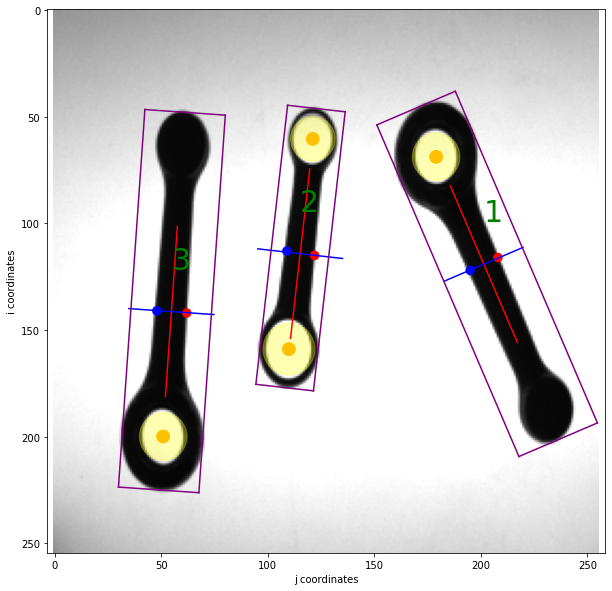



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [201, 119] -66.82  168.86  40.31    15.23
component_2    B       [115, 114]  83.44  131.74  27.20    13.15
component_3    A        [55, 141]  86.00  177.55  37.82    14.04


                 center (j,1)  diameter
hole_1_of_comp_1    [179, 69]     22.28
hole_1_of_comp_2    [121, 60]     20.94
hole_2_of_comp_2   [110, 159]     24.46
hole_1_of_comp_3    [51, 200]     22.27


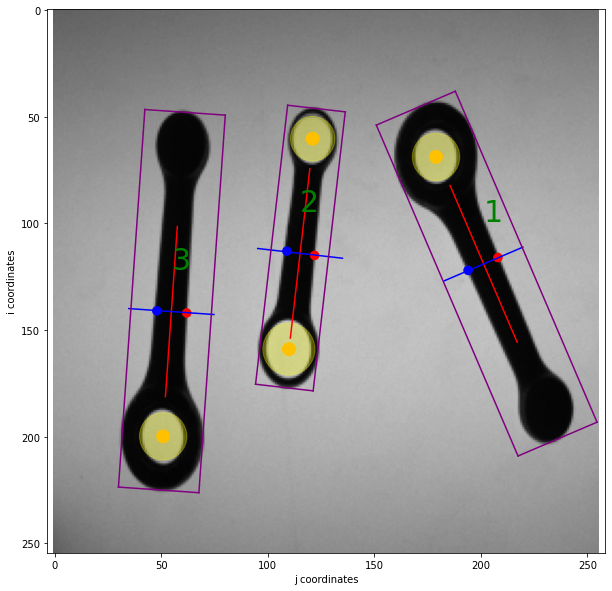



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A         [82, 82]  42.05  151.86  44.73    16.28
component_2    B       [128, 117]   3.30  100.47  35.35    17.03
component_3    A       [105, 172]   5.38  136.99  50.06    19.10


                 center (j,1)  diameter
hole_1_of_comp_1    [45, 116]     22.55
hole_1_of_comp_2   [163, 115]     24.43
hole_2_of_comp_2    [87, 119]     21.16
hole_1_of_comp_3   [150, 168]     22.88


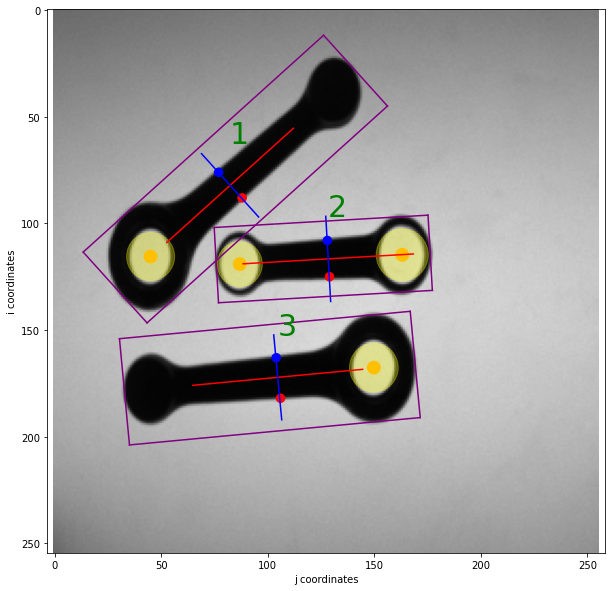



            type barycenter (j,i)  theta       L      W  W_baric
component_1    B        [114, 91]  63.78  156.58  37.12    17.89
component_2    A       [153, 162]  42.21  192.91  57.00    21.93


                 center (j,1)  diameter
hole_1_of_comp_1    [138, 45]     29.50
hole_2_of_comp_1    [84, 150]     26.73
hole_1_of_comp_2   [201, 120]     28.56


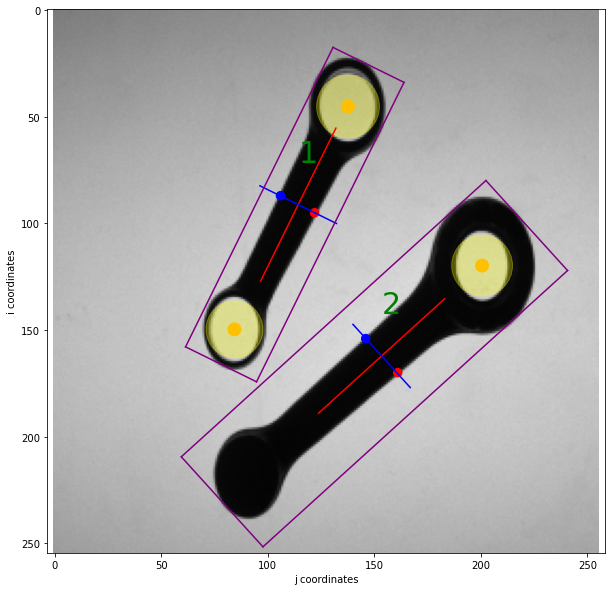



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [189, 143]  59.58  208.09  52.72    19.72
component_2    B        [86, 160]   3.03  127.40  46.04    23.02


                 center (j,1)  diameter
hole_1_of_comp_1    [224, 84]     27.92
hole_1_of_comp_2   [129, 158]     30.82
hole_2_of_comp_2    [33, 164]     26.32


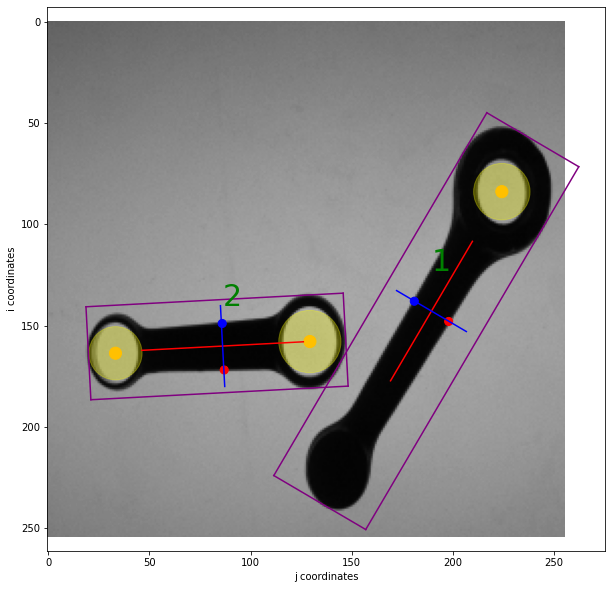



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [104, 106]  44.45  194.40  56.09    21.21
component_2    A       [155, 146]  35.09  186.97  59.37    22.20


                 center (j,1)  diameter
hole_1_of_comp_1    [150, 62]     28.30
hole_1_of_comp_2   [105, 180]     28.65


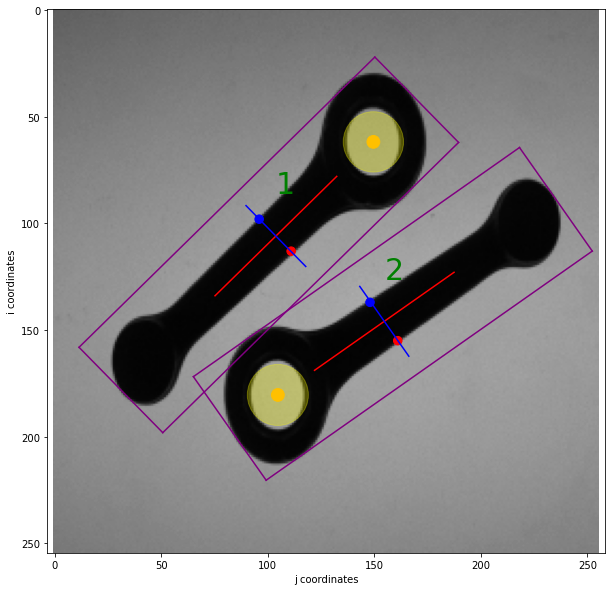



            type barycenter (j,i)  theta       L      W  W_baric
component_1    C       [161, 104]    NaN     NaN    NaN      NaN
component_2    A       [162, 169] -34.58  181.61  57.26    20.25
component_3    C       [137, 221]    NaN     NaN    NaN      NaN


                 center (j,1)  diameter
hole_1_of_comp_2   [212, 201]      27.0


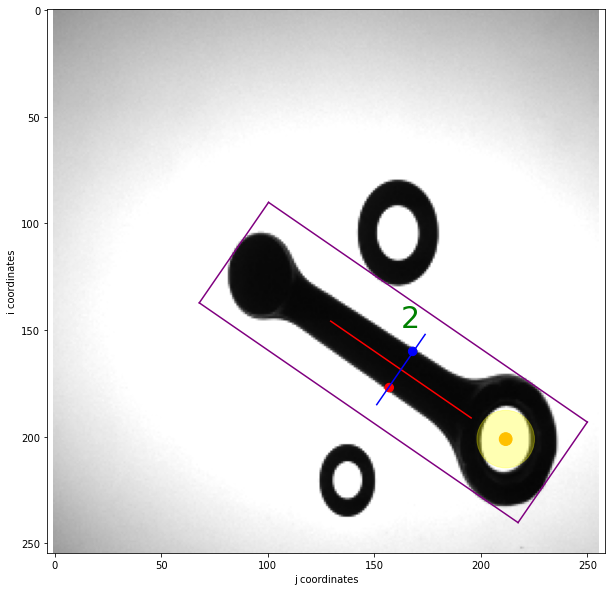



            type barycenter (j,i)  theta       L      W  W_baric
component_1    C        [206, 86]    NaN     NaN    NaN      NaN
component_2    A       [166, 158] -47.33  191.74  54.09    20.52
component_3    B        [84, 175] -25.79  129.25  43.07    21.02


                 center (j,1)  diameter
hole_1_of_comp_2   [208, 203]     27.03
hole_1_of_comp_3    [44, 157]     29.08
hole_2_of_comp_3   [133, 198]     26.20


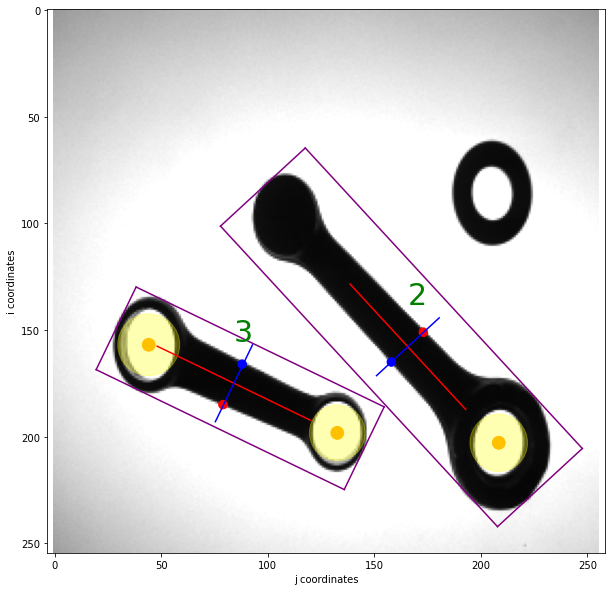



            type barycenter (j,i)  theta       L      W  W_baric
component_1    C       [202, 117]    NaN     NaN    NaN      NaN
component_2    A       [165, 167] -47.17  191.64  54.11    20.52
component_3    B        [84, 175] -25.74  129.24  42.64    21.47


                 center (j,1)  diameter
hole_1_of_comp_2   [208, 212]     26.95
hole_1_of_comp_3    [44, 157]     29.01
hole_2_of_comp_3   [133, 198]     26.20


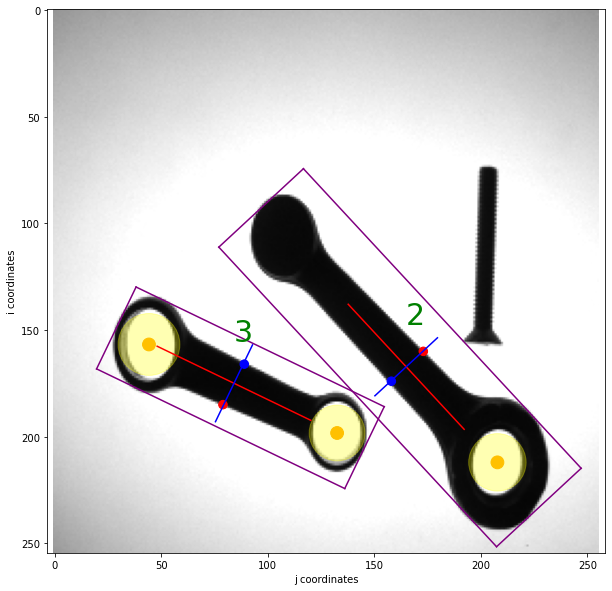



            type barycenter (j,i)  theta       L      W  W_baric
component_1    C       [203, 139]    NaN     NaN    NaN      NaN
component_2    C       [135, 121]    NaN     NaN    NaN      NaN
component_3    C        [98, 128]    NaN     NaN    NaN      NaN
component_4    B        [84, 174] -23.18  128.42  43.07    20.62


                 center (j,1)  diameter
hole_1_of_comp_4    [44, 158]     28.75
hole_2_of_comp_4   [134, 195]     26.26


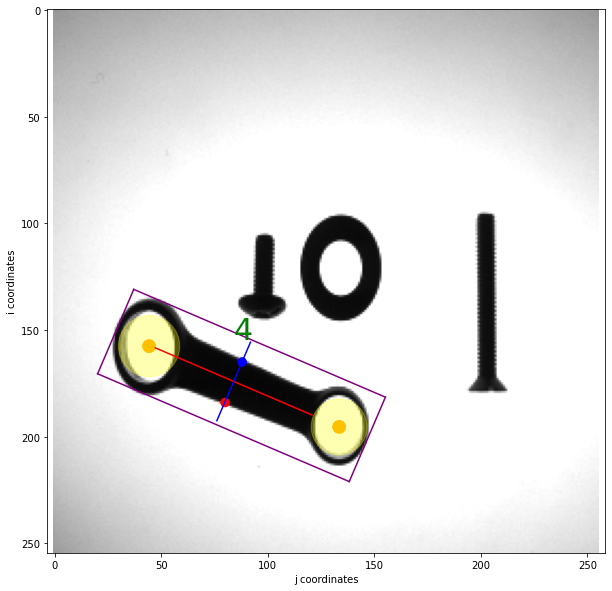



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [161, 113] -45.09  167.60  48.08    18.38
component_2    B        [81, 143] -51.91  127.84  33.97    16.40


                 center (j,1)  diameter
hole_1_of_comp_1    [121, 75]     24.55
hole_1_of_comp_2    [54, 110]     25.97
hole_2_of_comp_2   [114, 185]     23.02


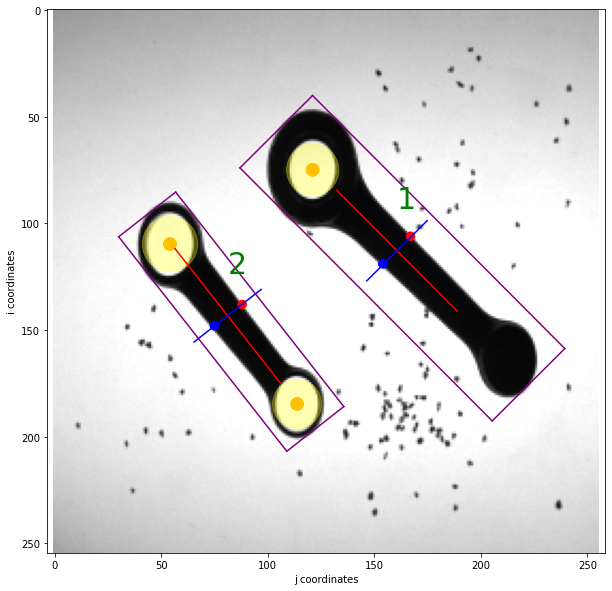



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A         [62, 99]  58.26  178.44  45.50    17.49
component_2    B       [190, 110]   6.80  110.25  38.56    19.10
component_3    A       [157, 172]  -5.21  148.39  54.32    20.10


                 center (j,1)  diameter
hole_1_of_comp_1    [31, 149]     24.28
hole_1_of_comp_2   [228, 106]     25.44
hole_2_of_comp_2   [146, 114]     22.82
hole_1_of_comp_3   [206, 176]     24.30


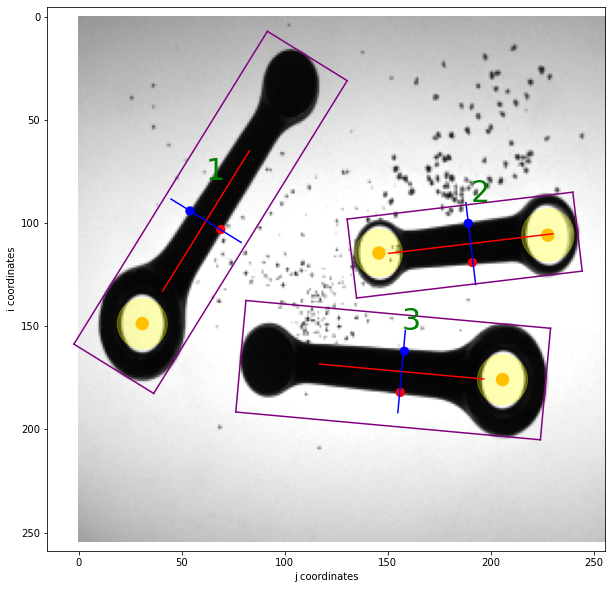



            type barycenter (j,i)  theta       L      W  W_baric
component_1    A       [180, 127]  61.99  181.01  44.69    15.65
component_2    B        [76, 130] -31.19  116.82  37.19    18.87


                 center (j,1)  diameter
hole_1_of_comp_1    [208, 74]     24.05
hole_1_of_comp_2    [34, 106]     22.48
hole_2_of_comp_2   [110, 150]     26.52


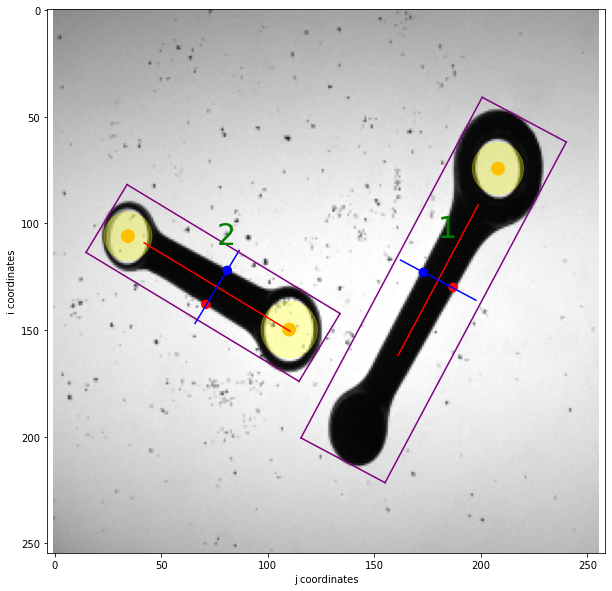



            type barycenter (j,i)  theta   L   W  W_baric
component_1    A       [104, 106]  19.57 NaN NaN    18.97
component_2    A       [152, 123]  41.17 NaN NaN    18.44
component_3    B       [171, 165]  15.95 NaN NaN    18.68


                            center (j,1)  diameter
hole_1_associated_to_comp_1    [43, 128]     24.37
hole_2_associated_to_comp_3   [214, 154]     25.98
hole_3_associated_to_comp_2    [99, 169]     24.95
hole_4_associated_to_comp_3   [133, 176]     23.18


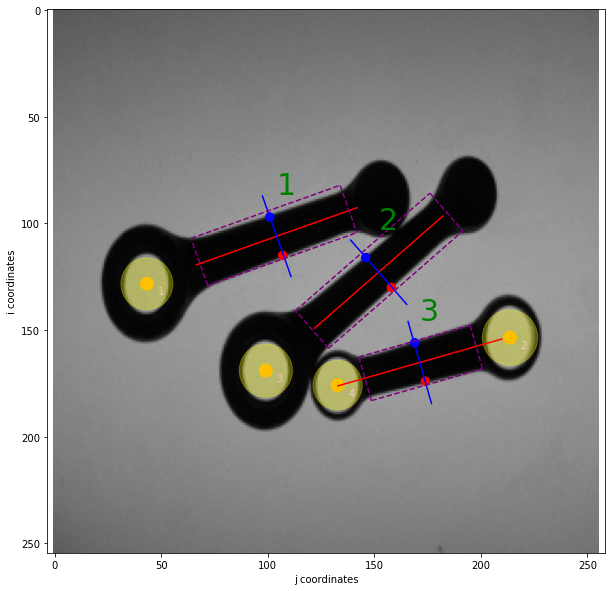



            type barycenter (j,i)  theta       L     W  W_baric
component_1    A        [64, 134]  61.95     NaN   NaN    14.76
component_2    A       [143, 117]  36.30     NaN   NaN    17.20
component_3    B       [159, 169]  37.81  119.89  35.8    17.20


                            center (j,1)  diameter
hole_1_associated_to_comp_1    [100, 66]     24.41
hole_2_associated_to_comp_2    [88, 157]     24.85
hole_1_of_comp_3              [192, 144]     26.25
hole_2_of_comp_3              [120, 198]     22.98


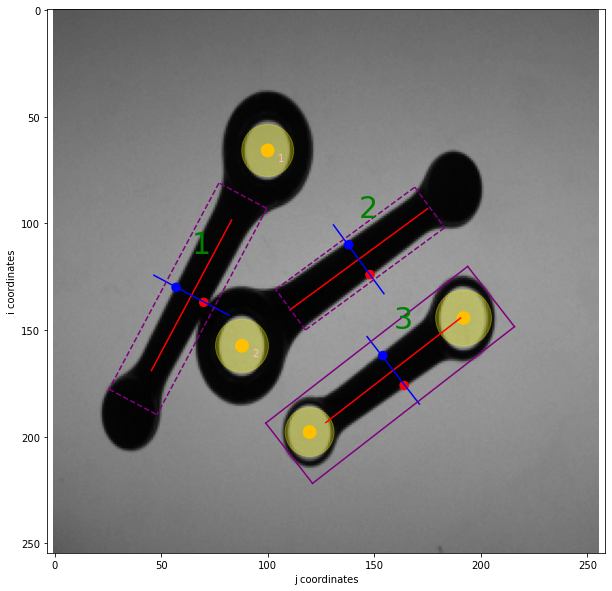

In [19]:
for img in img_list:
    ret,thresh = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    input = cv2.medianBlur(thresh,3)            #this median filter reduces the noise and helps the binarization in the shadow areas
    components,holes,info_df=Components_stats_open(input,img)